In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils

# path to predictions folder (stored in repository by default)
# unexpected behavior might occur if you use another location
path = '/home/sareeves/thermostability-transfer'
preds_loc = os.path.join(path, 'data', 'fireprot_mapped_preds_cluster.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

In [2]:
### load and preprocess data

# load main data
db = pd.read_csv(preds_loc, index_col=0)
# don't assume that anything except the uids and predictions are in the preds file
db2 = pd.read_csv(os.path.join(path, 'data', 'fireprot_mapped.csv'), index_col=0)
db2 = db2[[col for col in db2.columns if col not in db.columns]]
# join the predictions with the original FireProt information
db = db.join(db2, how='right')

# get only curated mutations for all future analyses
#db = db.loc[db['is_curated']]
#print(len(db))

db['mpnn_mean_dir'] = db[['mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir']].mean(axis=1)
db['runtime_mpnn_mean_dir'] = db[['runtime_mpnn_10_00_dir', 'runtime_mpnn_20_00_dir', 'runtime_mpnn_30_00_dir']].sum(axis=1)

# drop locations with no indicated position
db = db.dropna(subset=['position'])

# uid (specified in preprocessing) is the index for this database
db = db.reset_index().rename({'index': 'uid'}, axis=1)

# extract information about data origins
db['ProTherm'] = db['datasets'].apply(lambda x: 'ProTherm' in str(x))
db['FireProt'] = db['datasets'].apply(lambda x: 'FireProt' in str(x))
db['ThermoFluor'] = db['method'].apply(lambda x: 'ThermoFluor' in str(x))

# extract ground-truth labels and selected attributes of the data
db_measurements = db.groupby(['uid']).agg({'ddG':'median', 'dTm':'median', 'ProTherm':'max', 'FireProt':'max', 'ThermoFluor':'max', 'code':'first', 'is_curated':'median', 'window_start': 'first'})
print('Number of unique mutations with computed predictions', len(db_measurements))

db = db.set_index('uid')
# use ddG of unfolding so that both dTm and ddG are positive for stabilizing
db_measurements['ddG'] = -db_measurements['ddG']

# extract prediction columns
incl = [col for col in db.columns if '_dir' in col and not 'runtime' in col]
# get only unique mutations (predictions are always the same)
db_preds = db[incl].drop_duplicates()

# extract runtimes for each prediction type
db_runtimes = db[[col for col in db.columns if 'runtime' in col] + ['code']].drop_duplicates()
# estimate the per-mutation runtime (the code takes about 6 seconds to run 6313 mutations)
db_runtimes['runtime_korpm_dir'] = 0.001

# reassign the Tranception runtimes to be per-mutation (by dividing by the number of mutations)
for col in [c for c in db_runtimes.columns if 'tranception' in c]:
    grouped = db_runtimes.groupby('code')[col]
    mean_values = grouped.mean()
    group_sizes = grouped.size()

    # Divide mean values by group sizes
    divided_values = mean_values / group_sizes
    # Merge the divided_values back to the original DataFrame
    db_runtimes = db_runtimes.merge(divided_values.rename('divided_value'), left_on='code', right_index=True)
    # Reassign the 'target_column' values with the divided values
    db_runtimes[col] = db_runtimes['divided_value']
    # Drop the 'divided_value' column
    db_runtimes = db_runtimes.drop('divided_value', axis=1)

# load effective number of sequences from separate file (generated by MSA transformer)
neff = pd.read_csv(os.path.join(path, 'data', 'neff.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff']
neff = neff.groupby(level=0).max()

# drop any NaN columns
db_preds = db_preds.dropna(how='all', axis=1)

# output a glimpse of the dataframe
db_preds

# ~15 seconds

Number of unique mutations with computed predictions 6313


,esm1v_1_dir,esm1v_2_dir,esm1v_3_dir,esm1v_4_dir,esm1v_5_dir,esm1v_mean_dir,esm1v_median_dir,esmif_monomer_dir,esmif_multimer_dir,esmif_multimer_masked_dir,...,mpnn_30_03_dir,msa_1_dir,msa_2_dir,msa_3_dir,msa_4_dir,msa_5_dir,msa_transformer_mean_dir,msa_transformer_median_dir,tranception_dir,mpnn_mean_dir
uid,,,,,,,,,,,,,,,,,,,,,
1A23_170A,-15.331059,-14.401003,-10.385515,-12.392609,-12.903854,-13.082808,-12.903854,-0.058681,-0.058681,-0.066285,...,-5.617502,-10.355862,-11.639415,-10.852303,-10.249341,-10.955347,-10.810454,-10.852303,-0.215164,-5.389226
1A23_49S,-11.866286,-14.168181,-9.162907,-16.741142,-13.370914,-13.061886,-13.370914,-0.043712,-0.043713,-0.061088,...,-0.834059,-9.654161,-10.559225,-9.881346,-8.935917,-10.067811,-9.819692,-9.881346,-0.109843,0.836483
1A23_51L,-11.959614,-13.072000,-12.592305,-11.451341,-11.998134,-12.214679,-11.998134,-0.042389,-0.042389,-0.046137,...,0.725079,-10.005238,-10.420140,-10.303625,-8.230253,-9.950893,-9.782030,-10.005238,-0.059805,0.620266
1A23_51S,-5.343360,-9.254457,-6.640478,-5.004925,-8.345306,-6.917705,-6.640478,-0.029983,-0.029983,-0.034219,...,0.441230,-7.933827,-8.190239,-7.994496,-5.345653,-7.100224,-7.312888,-7.933827,-0.032687,0.714471
1A23_51Y,-6.208373,-8.168402,-8.557674,-7.086007,-5.908095,-7.185710,-7.086007,-0.020219,-0.020220,-0.021575,...,0.094002,-6.306651,-6.688507,-5.786233,-3.899557,-6.085909,-5.753371,-6.085909,-0.039248,0.293576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6TQ3_97A,0.723551,0.124287,0.415688,1.565497,1.050648,0.775934,0.723551,0.005651,0.004415,-0.002637,...,0.023748,0.849599,1.420359,1.599032,1.354338,1.076792,1.260024,1.354338,0.001227,0.762620
6TQ3_97K,-3.757156,-3.769334,-5.523852,-3.773157,-5.350204,-4.434741,-3.773157,-0.015521,-0.009634,-0.018640,...,-1.241848,-3.769880,-4.089123,-3.806564,-4.175095,-3.841910,-3.936514,-3.841910,-0.014756,-1.288895
6TQ3_9P,-1.863402,-1.519017,-0.976884,0.774134,-0.441149,-0.805264,-0.976884,-0.012842,-0.012136,-0.015382,...,1.246519,-1.713644,-0.251627,-0.190202,-0.185036,-2.376058,-0.943313,-0.251627,0.000044,1.325511


In [3]:
# extract existing features from FireProtDB (not used)
feats = ['asa', 'b_factor', 'conservation', 
       'interpro_families', 'is_back_to_consensus', 'is_curated',
       'is_essential', 'is_in_catalytic_pocket', 'is_in_tunnel_bottleneck',
       'method', 'pH', 'secondary_structure', 'tm']

# get only unique mutations
db_feats = db[feats].drop_duplicates()

# load features generated by preprocessing/compute_features.py
db_feats_2 = pd.read_csv(os.path.join(path, 'data', 'fireprot_mapped_feats.csv'))

# preprocess raw features
db_feats_2['uid'] = db_feats_2['code'] + '_' + db_feats_2['position'].astype(str) + db_feats_2['mutation']
db_feats_2 = db_feats_2.set_index('uid')
db_feats_2 = db_feats_2[[
       'code', 'wild_type', 'mutation', 'on_interface', 'entropy', 
       'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 
       'structure_length', 'sequence_length','multimer', 'SS','features', 
       'hbonds', 'saltbrs', 'b_factor', 'kdh_wt', 'kdh_mut', 'vol_wt', 
       'vol_mut', 'chg_wt', 'chg_mut', 'abs_ASA', #'residue_depth',
       ]]

# derived from SwissProt
db_feats_2['on_interface'] = db_feats_2['on_interface'].astype(int)
db_feats_2['features'] = db_feats_2['features'].fillna("")
db_feats_2['binding'] = db_feats_2['features'].str.contains('BINDING')
db_feats_2['active_site'] = db_feats_2['features'].str.contains('ACT_SITE')

# change in physicochemical features
db_feats_2['delta_kdh'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']

# unusual / important identities
db_feats_2['to_proline'] = db_feats_2['mutation'] == 'P'
db_feats_2['to_glycine'] = db_feats_2['mutation'] == 'G'
db_feats_2['from_proline'] = db_feats_2['wild_type'] == 'P'
db_feats_2['from_glycine'] = db_feats_2['wild_type'] == 'G'
db_feats_2['to_alanine'] = db_feats_2['mutation'] == 'A'

# secondary structure
db_feats_2['helix'] = db_feats_2['SS'] == 'H'
db_feats_2['bend'] = db_feats_2['SS'] == 'S'
db_feats_2['turn'] = db_feats_2['SS'] == 'T'
db_feats_2['coil'] = db_feats_2['SS'] == '-'
db_feats_2['strand'] = db_feats_2['SS'] == 'E'

# drop raw features
db_feats_2 = db_feats_2.drop([
       'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 
       'features', 'SS', 'wild_type', 'mutation'
       ], axis=1)

db_feats_2 = db_feats_2.reset_index().merge(neff, on='code', how='left').drop('code', axis=1).set_index('uid')
db_feats_2 = db_feats_2.join(db_measurements[['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor']])#.join(db_feats, rsuffix='_fp', how='inner')
print(len(db_feats_2))
db_feats_2['ProTherm']

6313


uid
1A23_170A     True
1A23_49S      True
1A23_51L      True
1A23_51S      True
1A23_51Y      True
             ...  
6TQ3_97A     False
6TQ3_97K     False
6TQ3_9P      False
8TIM_179A    False
8TIM_193A    False
Name: ProTherm, Length: 6313, dtype: bool

In [4]:
print('getting cartesian predictions')
# assuming you have designated the repo location as the path
df_cart, df_cart_runtimes = analysis_utils.parse_rosetta_predictions(db, os.path.join(path, 'rosetta_predictions'))
db_preds = db_preds.join(df_cart.astype(float), how='left')
db_runtimes = db_runtimes.join(df_cart_runtimes.astype(float), how='left')

# ~34 seconds on SSD, 5 minutes on HDD

getting cartesian predictions


In [5]:
db_class = db_preds.join(db_measurements).drop('code', axis=1).join(db_runtimes.drop('code', axis=1))
print(len(db_class))

# can uncomment to look at non-ProTherm or Curated mutaions
#db_class = db_class.loc[~db_class['ProTherm'].astype(bool)]
#db_class = db_class.loc[db_class['is_curated'].astype(bool)]

# dropna from korpm and msa_transformer, which encompass all expected missing mutant predictions
db_class = db_class.dropna(subset='korpm_dir')
print(len(db_class))
db_class = db_class.dropna(subset='msa_transformer_mean_dir')
print(len(db_class))

# add 'fake' prediction columns from the ground truth labels for controls
db_class['ddG_dir'] = db_class['ddG']
db_class['dTm_dir'] = db_class['dTm']
# random (uniform noise) control
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))

6313
6305
6283


In [6]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
summ = analysis_utils.compute_stats(db_class, stats=(), n_classes=2)
rcv = summ.copy(deep=True)
# uncomment this to save all stats and see which are available for other analyses
summ.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_all.csv')
tmp = summ.loc[:,['MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'ausrc': 'AUPSC', 'weighted_ndcg': 'wNDCG', 'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC'}#, 'mean_spearman': 'mρ', 'runtime': 'runtime (s)'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG', 'ΔTm'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)#.rename_axis(index={'measurement': 'meas', 'model_type': 'type'})
tmp.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_select.csv')
tmp

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

MCC  AUPRC      ρ  wNDCG  wAUPRC  \
measurement model_type   model                                                  
ΔΔG         structural   Rosetta_CartDDG   0.327  0.534  0.608  0.910   0.537   
                         ProteinMPNN_30    0.257  0.470  0.436  0.911   0.543   
                         ProteinMPNN_20    0.261  0.475  0.439  0.914   0.547   
                         ProteinMPNN_mean  0.267  0.481  0.448  0.913   0.548   
                         ESM-IF            0.214  0.444  0.375  0.907   0.522   
                         MIF               0.209  0.440  0.433  0.909   0.514   
                         ESM-IF(M)         0.205  0.438  0.364  0.906   0.509   
                         ProteinMPNN_10    0.244  0.466  0.433  0.908   0.535   
                         MIF-ST            0.195  0.431  0.411  0.906   0.481   
                         KORPM             0.276  0.461  0.502  0.898   0.494   
            evolutionary MSA-T_mean        0.155  0.408  0.317  0.902   0.479   
                         MSA-T_1           0.138  0.395  0.306  0.898   0.470   
                         ESM-1V_mean       0.108  0.351  0.177  0.891   0.444   
                         ESM-1V_2          0.105  0.348  0.179  0.889   0.444   
                         Tranception       0.097  0.341  0.238  0.891   0.441   
            N/A          Gaussian noise   -0.009  0.258 -0.008  0.838   0.345   
ΔTm         structural   ESM-IF            0.243  0.546  0.539  0.912   0.580   
                         ESM-IF(M)         0.249  0.543  0.527  0.909   0.576   
                         Rosetta_CartDDG   0.249  0.500  0.511  0.905   0.586   
                         MIF               0.256  0.528  0.454  0.907   0.583   
                         ProteinMPNN_20    0.311  0.565  0.506  0.905   0.606   
                         ProteinMPNN_30    0.317  0.569  0.498  0.905   0.614   
                         ProteinMPNN_mean  0.309  0.573  0.510  0.905   0.611   
                         ProteinMPNN_10    0.297  0.556  0.490  0.904   0.604   
                         MIF-ST            0.207  0.497  0.409  0.900   0.568   
                         KORPM             0.239  0.465  0.419  0.892   0.556   
            evolutionary ESM-1V_mean       0.169  0.447  0.287  0.894   0.548   
                         MSA-T_mean        0.186  0.481  0.385  0.895   0.583   
                         MSA-T_1           0.187  0.485  0.378  0.894   0.583   
                         ESM-1V_2          0.151  0.444  0.299  0.890   0.546   
                         Tranception       0.148  0.457  0.377  0.883   0.554   
            N/A          Gaussian noise   -0.011  0.316  0.007  0.853   0.451   

                                              wρ  
measurement model_type   model                    
ΔΔG         structural   Rosetta_CartDDG   0.428  
                         ProteinMPNN_30    0.390  
                         ProteinMPNN_20    0.389  
                         ProteinMPNN_mean  0.389  
                         ESM-IF            0.387  
                         MIF               0.378  
                         ESM-IF(M)         0.369  
                         ProteinMPNN_10    0.361  
                         MIF-ST            0.351  
                         KORPM             0.341  
            evolutionary MSA-T_mean        0.304  
                         MSA-T_1           0.281  
                         ESM-1V_mean       0.264  
                         ESM-1V_2          0.264  
                         Tranception       0.253  
            N/A          Gaussian noise   -0.022  
ΔTm         structural   ESM-IF            0.388  
                         ESM-IF(M)         0.381  
                         Rosetta_CartDDG   0.362  
                         MIF               0.350  
                         ProteinMPNN_20    0.346  
                         ProteinMPNN_30    0.335  
                         ProteinMPNN_mean  0.332  
               

In [7]:
# SUPPLEMENTARY TABLE 1

summ = analysis_utils.compute_stats(db_class, stats=(), n_classes=3)
summ.to_csv('~/zs_suppl/fireprot_summ_final_3_classes_all.csv')
tmp = summ.loc[:,['MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'ausrc': 'AUPSC', 'weighted_ndcg': 'wNDCG', 'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'ESM-IF(H)',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Tranception(F)', 'Gaussian noise'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp.to_csv('~/zs_suppl/fireprot_summ_final_3_classes_select.csv')
tmp

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

MCC  AUPRC      ρ  wNDCG  wAUPRC  \
measurement model_type   model                                                  
ΔΔG         structural   Rosetta_CartDDG   0.464  0.533  0.557  0.904   0.456   
                         ESM-IF            0.334  0.425  0.387  0.896   0.391   
                         ESM-IF(M)         0.316  0.417  0.381  0.893   0.376   
                         KORPM             0.365  0.418  0.463  0.891   0.408   
                         ProteinMPNN_20    0.381  0.429  0.399  0.899   0.436   
                         ProteinMPNN_30    0.369  0.426  0.391  0.896   0.437   
                         MIF-ST            0.310  0.360  0.386  0.884   0.366   
                         ProteinMPNN_mean  0.402  0.440  0.401  0.898   0.442   
            evolutionary MSA-T_mean        0.243  0.292  0.349  0.886   0.308   
            structural   MIF               0.356  0.437  0.425  0.891   0.407   
            evolutionary MSA-T_1           0.224  0.276  0.344  0.883   0.307   
                         Tranception       0.197  0.219  0.231  0.882   0.318   
            structural   ProteinMPNN_10    0.375  0.415  0.381  0.891   0.424   
            evolutionary ESM-1V_mean       0.188  0.261  0.188  0.876   0.307   
                         ESM-1V_2          0.171  0.250  0.190  0.873   0.313   
            N/A          Gaussian noise   -0.001  0.115  0.009  0.824   0.243   
ΔTm         structural   ESM-IF(M)         0.399  0.649  0.636  0.901   0.497   
                         ESM-IF            0.413  0.664  0.652  0.900   0.490   
                         Rosetta_CartDDG   0.395  0.574  0.602  0.899   0.528   
                         ProteinMPNN_30    0.461  0.636  0.514  0.893   0.511   
                         MIF-ST            0.356  0.548  0.461  0.886   0.456   
                         KORPM             0.333  0.459  0.447  0.882   0.467   
                         ProteinMPNN_20    0.459  0.649  0.511  0.895   0.509   
                         MIF               0.385  0.592  0.509  0.886   0.461   
                         ProteinMPNN_mean  0.456  0.649  0.519  0.895   0.518   
                         ProteinMPNN_10    0.449  0.617  0.500  0.893   0.514   
            evolutionary MSA-T_mean        0.284  0.504  0.421  0.883   0.423   
                         MSA-T_1           0.289  0.511  0.417  0.882   0.424   
                         ESM-1V_mean       0.262  0.439  0.336  0.877   0.427   
                         Tranception       0.270  0.468  0.430  0.873   0.441   
                         ESM-1V_2          0.244  0.444  0.355  0.873   0.424   
            N/A          Gaussian noise   -0.005  0.233  0.036  0.837   0.363   

                                              wρ  
measurement model_type   model                    
ΔΔG         structural   Rosetta_CartDDG   0.376  
                         ESM-IF            0.335  
                         ESM-IF(M)         0.322  
                         KORPM             0.321  
                         ProteinMPNN_20    0.305  
                         ProteinMPNN_30    0.301  
                         MIF-ST            0.294  
                         ProteinMPNN_mean  0.294  
            evolutionary MSA-T_mean        0.293  
            structural   MIF               0.292  
            evolutionary MSA-T_1           0.288  
                         Tranception       0.277  
            structural   ProteinMPNN_10    0.265  
            evolutionary ESM-1V_mean       0.243  
                         ESM-1V_2          0.208  
            N/A          Gaussian noise   -0.013  
ΔTm         structural   ESM-IF(M)         0.366  
                         ESM-IF            0.346  
                         Rosetta_CartDDG   0.328  
                         ProteinMPNN_30    0.285  
                         MIF-ST            0.284  
                         KORPM             0.279  
                         ProteinMPNN_20    0.275  
               

In [8]:
# SUPPLEMENTARY TABLE 2

db_class_np = db_class.loc[~db_class['ProTherm'].astype(bool)]

summ = analysis_utils.compute_stats(db_class_np, stats=(), n_classes=2)
summ.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_no_protherm_all.csv')
tmp = summ.loc[:,['MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'ausrc': 'AUPSC', 'weighted_ndcg': 'wNDCG', 'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'ESM-IF(H)',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Tranception(F)', 'Gaussian noise'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp.to_csv('~/zs_suppl/fireprot_summ_final_2_classes_no_protherm_select.csv')
tmp

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

MCC  AUPRC      ρ  wNDCG  wAUPRC  \
measurement model_type   model                                                  
ΔΔG         structural   ProteinMPNN_30    0.182  0.542  0.385  0.917   0.534   
                         ProteinMPNN_20    0.194  0.548  0.385  0.915   0.525   
                         ProteinMPNN_mean  0.181  0.545  0.394  0.914   0.528   
                         ESM-IF            0.157  0.497  0.336  0.904   0.504   
                         Rosetta_CartDDG   0.344  0.649  0.635  0.906   0.517   
                         MIF               0.138  0.514  0.385  0.907   0.503   
                         ProteinMPNN_10    0.161  0.530  0.375  0.899   0.507   
                         ESM-IF(M)         0.145  0.492  0.339  0.901   0.492   
                         KORPM             0.321  0.593  0.520  0.885   0.482   
                         MIF-ST            0.161  0.546  0.401  0.905   0.505   
            evolutionary MSA-T_1           0.056  0.448  0.220  0.894   0.461   
                         MSA-T_mean        0.077  0.459  0.225  0.896   0.462   
                         ESM-1V_mean       0.080  0.422  0.175  0.887   0.432   
                         ESM-1V_2          0.076  0.419  0.167  0.880   0.435   
                         Tranception       0.029  0.377  0.114  0.881   0.441   
            N/A          Gaussian noise   -0.014  0.351  0.004  0.829   0.327   
ΔTm         structural   MIF               0.158  0.523  0.314  0.896   0.601   
                         ESM-IF(M)         0.156  0.512  0.343  0.881   0.594   
                         ESM-IF            0.151  0.514  0.356  0.884   0.597   
                         ProteinMPNN_mean  0.211  0.558  0.377  0.880   0.618   
                         ProteinMPNN_20    0.216  0.559  0.375  0.876   0.615   
                         ProteinMPNN_30    0.221  0.555  0.358  0.878   0.613   
                         ProteinMPNN_10    0.226  0.551  0.364  0.892   0.620   
            evolutionary ESM-1V_mean       0.107  0.470  0.198  0.869   0.592   
            structural   MIF-ST            0.086  0.494  0.255  0.870   0.572   
            evolutionary MSA-T_1           0.087  0.480  0.205  0.870   0.583   
            structural   Rosetta_CartDDG   0.076  0.465  0.244  0.872   0.569   
            evolutionary Tranception       0.088  0.472  0.260  0.866   0.587   
                         ESM-1V_2          0.091  0.463  0.195  0.869   0.591   
                         MSA-T_mean        0.093  0.472  0.208  0.861   0.577   
            structural   KORPM             0.114  0.440  0.209  0.861   0.567   
            N/A          Gaussian noise   -0.033  0.374 -0.030  0.862   0.551   

                                              wρ  
measurement model_type   model                    
ΔΔG         structural   ProteinMPNN_30    0.447  
                         ProteinMPNN_20    0.446  
                         ProteinMPNN_mean  0.426  
                         ESM-IF            0.390  
                         Rosetta_CartDDG   0.388  
                         MIF               0.382  
                         ProteinMPNN_10    0.371  
                         ESM-IF(M)         0.371  
                         KORPM             0.334  
                         MIF-ST            0.330  
            evolutionary MSA-T_1           0.305  
                         MSA-T_mean        0.304  
                         ESM-1V_mean       0.298  
                         ESM-1V_2          0.279  
                         Tranception       0.226  
            N/A          Gaussian noise   -0.019  
ΔTm         structural   MIF               0.239  
                         ESM-IF(M)         0.237  
                         ESM-IF            0.218  
                         ProteinMPNN_mean  0.206  
                         ProteinMPNN_20    0.205  
                         ProteinMPNN_30    0.198  
                         ProteinMPNN_10    0.187  
            evo

6313


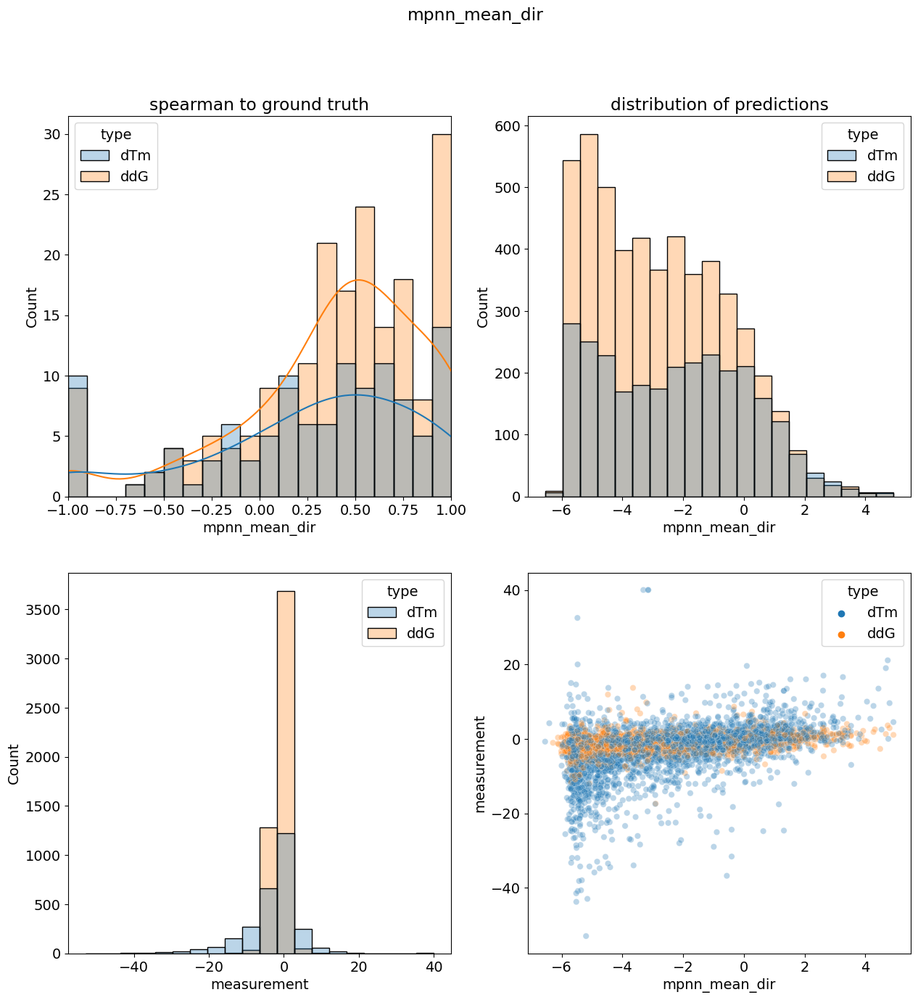

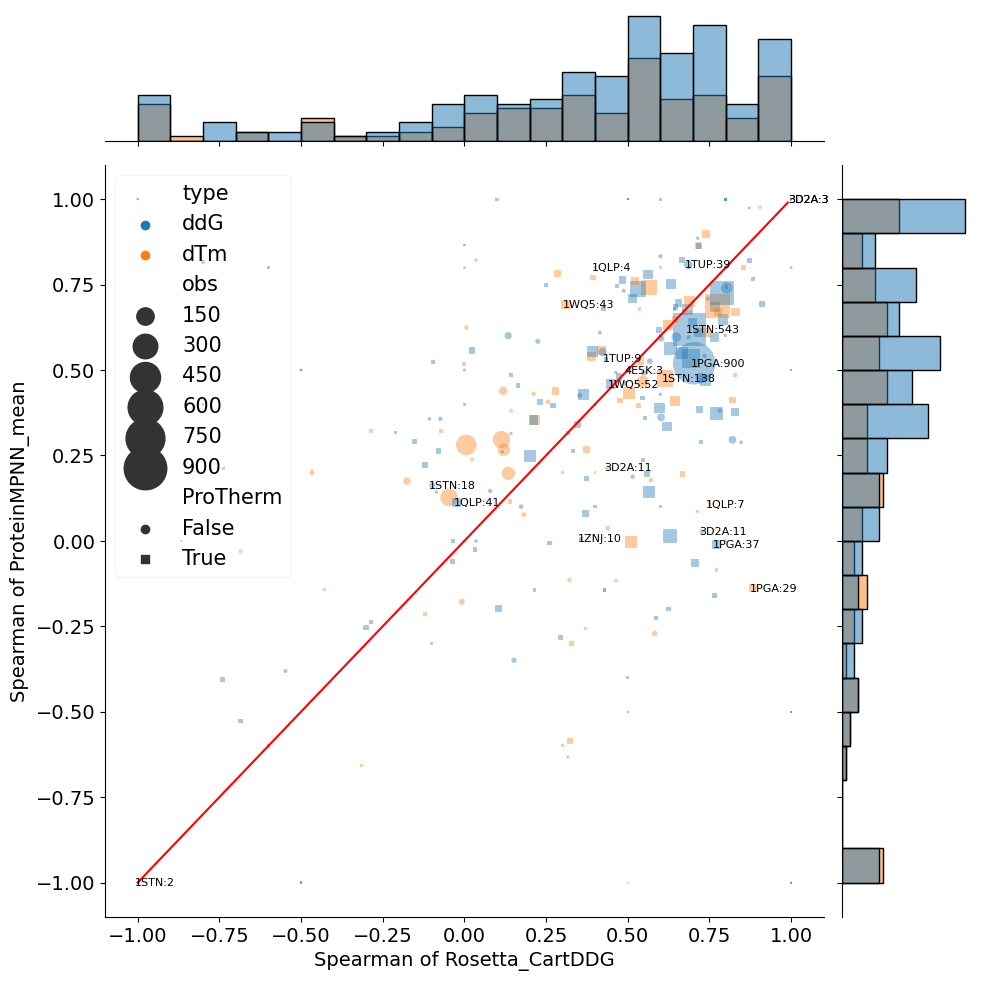

mpnn_mean_dir cartesian_ddg_dir
dTm n_total                      2796              2796
    ungrouped_spearman       0.509581          0.510162
    n_proteins                    131               131
    n_proteins_spearman           115               115
    avg_spearman             0.269391          0.318693
    weighted_spearman        0.335023          0.367637
    runtime (s)             85.684516         4592035.0
ddG n_total                      5065              5065
    ungrouped_spearman       0.446665           0.60121
    n_proteins                    176               176
    n_proteins_spearman           194               194
    avg_spearman             0.397766          0.365573
    weighted_spearman        0.409508          0.425745
    runtime (s)            124.716321         6795521.0

In [9]:
# SUPPLEMENTARY FIGURE 1 (second figure generated)

db_corr = db_preds.join(db_measurements)
print(len(db_corr))
#db_corr = db_corr.loc[~db_corr['ProTherm'].astype(bool)]

analysis_utils.correlations(db_corr, db_runtimes, stat='spearman', 
    score_name='mpnn_mean_dir', score_name_2='cartesian_ddg_dir', min_obs=1, group=True, plot=True, out=True, coeff2=3, runtime=True)

In [10]:
# SUPPLEMENTARY TABLE 3

tmp_ = analysis_utils.compute_stats(db_class, stats=['tp', 'fp', 'tn', 'fn', 'mean_t1s', 'auppc', 'aukxrc', 'mean_stabilization', 'net_stabilization'])
tmp_.to_csv('~/zs_suppl/fireprot_enrichment_all.csv')
tmp = tmp_.sort_values(['measurement', 'net_stabilization'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'tp': 'TP', 'fp': 'FP', 'tn': 'TN', 'fn': 'FN', 'mean_t1s': 'Mean Top-1 Score', 'auppc': 'AUPPC', 'aukxrc': 'AUKXRC', 'mean_stabilization': 'Mean Stabilization', 'net_stabilization': 'Net Stabilization'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp.drop('runtime', axis=1)
tmp = tmp.drop('class', axis=1)
tmp = tmp.drop([c for c in tmp.columns if '$' in c or 'x_recovery' in c], axis=1)
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ESM-IF', 'MIF', 'ESM-IF(M)',
                            'ProteinMPNN_10', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG', 'ΔTm'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp = tmp[['TP', 'FP', 'TN', 'FN', 'AUPPC', 'AUKXRC', 'Mean Top-1 Score', 'Mean Stabilization', 'Net Stabilization']]
#tmp.to_csv('../../zs_suppl/fireprot_enrichment_select.csv')
tmp = tmp.drop([c for c in tmp.columns if '$' in c or 'x_recovery' in c], axis=1).reset_index()
tmp = tmp.loc[tmp['model'].isin(['Rosetta_CartDDG', 'ProteinMPNN_mean', 'ProteinMPNN_30', 'ProteinMPNN_20', 'ProteinMPNN_10', 'ESM-IF', 'MIF', 
    'ESM-IF(M)',  'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'ESM-1V_mean', 'ESM-1V_2', 'Gaussian noise', 'ΔΔG', 'ΔTm'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp.to_csv('~/zs_suppl/fireprot_enrichment_select.csv')
tmp
# ~ 3 minutes

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

TP      FP      TN      FN  \
measurement model_type   model                                             
ΔΔG         structural   ProteinMPNN_mean  371.0   263.0  3409.0  1000.0   
                         Rosetta_CartDDG   577.0   457.0  3215.0   794.0   
                         ProteinMPNN_10    343.0   264.0  3408.0  1028.0   
                         ProteinMPNN_20    388.0   300.0  3372.0   983.0   
                         MIF-ST            239.0   190.0  3482.0  1132.0   
            evolutionary MSA-T_mean        128.0    85.0  3587.0  1243.0   
                         MSA-T_1           134.0   113.0  3559.0  1237.0   
            structural   ProteinMPNN_30    391.0   312.0  3360.0   980.0   
            evolutionary Tranception        86.0    85.0  3587.0  1285.0   
            structural   ESM-IF            284.0   228.0  3440.0  1087.0   
                         MIF               353.0   348.0  3324.0  1018.0   
                         ESM-IF(M)         282.0   240.0  3432.0  1089.0   
            evolutionary ESM-1V_mean       228.0   330.0  3342.0  1143.0   
            structural   KORPM             629.0   685.0  2987.0   742.0   
            evolutionary ESM-1V_2          224.0   329.0  3343.0  1147.0   
            N/A          Gaussian noise    677.0  1850.0  1822.0   694.0   
ΔTm         structural   ProteinMPNN_mean  339.0   209.0  1671.0   569.0   
                         ProteinMPNN_30    370.0   240.0  1640.0   538.0   
                         ProteinMPNN_20    353.0   225.0  1655.0   555.0   
                         ProteinMPNN_10    323.0   203.0  1677.0   585.0   
                         ESM-IF            238.0   154.0  1726.0   670.0   
                         ESM-IF(M)         244.0   155.0  1725.0   664.0   
                         MIF-ST            238.0   193.0  1687.0   670.0   
                         MIF               317.0   245.0  1635.0   591.0   
                         Rosetta_CartDDG   441.0   447.0  1433.0   467.0   
            evolutionary MSA-T_1           194.0   154.0  1726.0   714.0   
                         MSA-T_mean        193.0   153.0  1727.0   715.0   
                         Tranception       179.0   173.0  1707.0   729.0   
                         ESM-1V_mean       265.0   280.0  1600.0   643.0   
                         ESM-1V_2          252.0   283.0  1597.0   656.0   
            structural   KORPM             448.0   477.0  1403.0   460.0   
            N/A          Gaussian noise    448.0   949.0   931.0   460.0   

                                           AUPPC  AUKXRC  Mean Top-1 Score  \
measurement model_type   model                                               
ΔΔG         structural   ProteinMPNN_mean  0.424   0.393             0.036   
                         Rosetta_CartDDG   0.417   0.390            -0.030   
                         ProteinMPNN_10    0.415   0.385            -0.017   
                         ProteinMPNN_20    0.421   0.390             0.063   
                         MIF-ST            0.383   0.362            -0.015   
            evolutionary MSA-T_mean        0.349   0.335            -0.077   
                         MSA-T_1           0.346   0.333            -0.123   
            structural   ProteinMPNN_30    0.417   0.387            -0.042   
            evolutionary Tranception       0.333   0.324            -0.252   
            structural   ESM-IF            0.404   0.378             0.023   
                         MIF               0.403   0.376             0.077   
                         ESM-IF(M)         0.402   0.377            -0.050   
            evolutionary ESM-1V_mean       0.342   0.331            -0.274   
            structural   KORPM             0.387   0.366            -0.122   
            evolutionary ESM-1V_2          0.338   0.328            -0.285   
            N/A          Gaussian noise    0.258   0.274            -0.841   
ΔTm         structural   ProteinMPNN_mean  0.444   0.386 

NameError: name 'custom_colors' is not defined

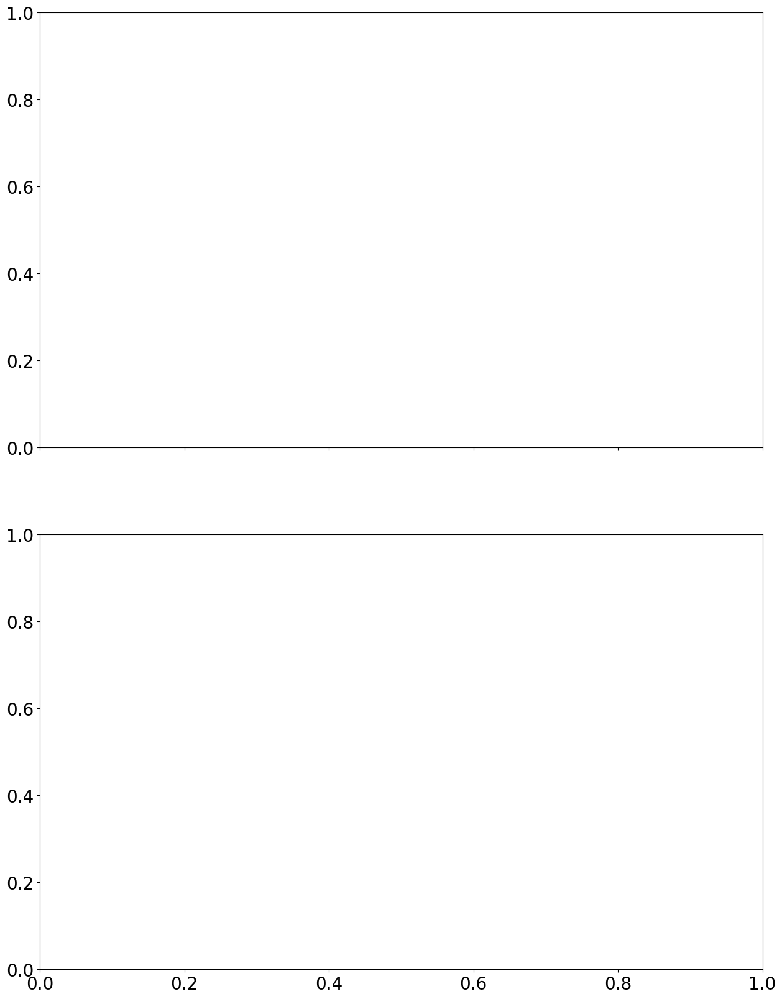

In [11]:
# Figure 1 a + b

custom_colors = {'cartesian_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor', 'dTm'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = analysis_utils.compare_performance(
                        db_complete,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        custom_colors = custom_colors
                        )

In [ ]:
# Figure 1 c + d

custom_colors = {'cartesian_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor', 'ddG'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = analysis_utils.compare_performance(
                        db_complete,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True
                        )

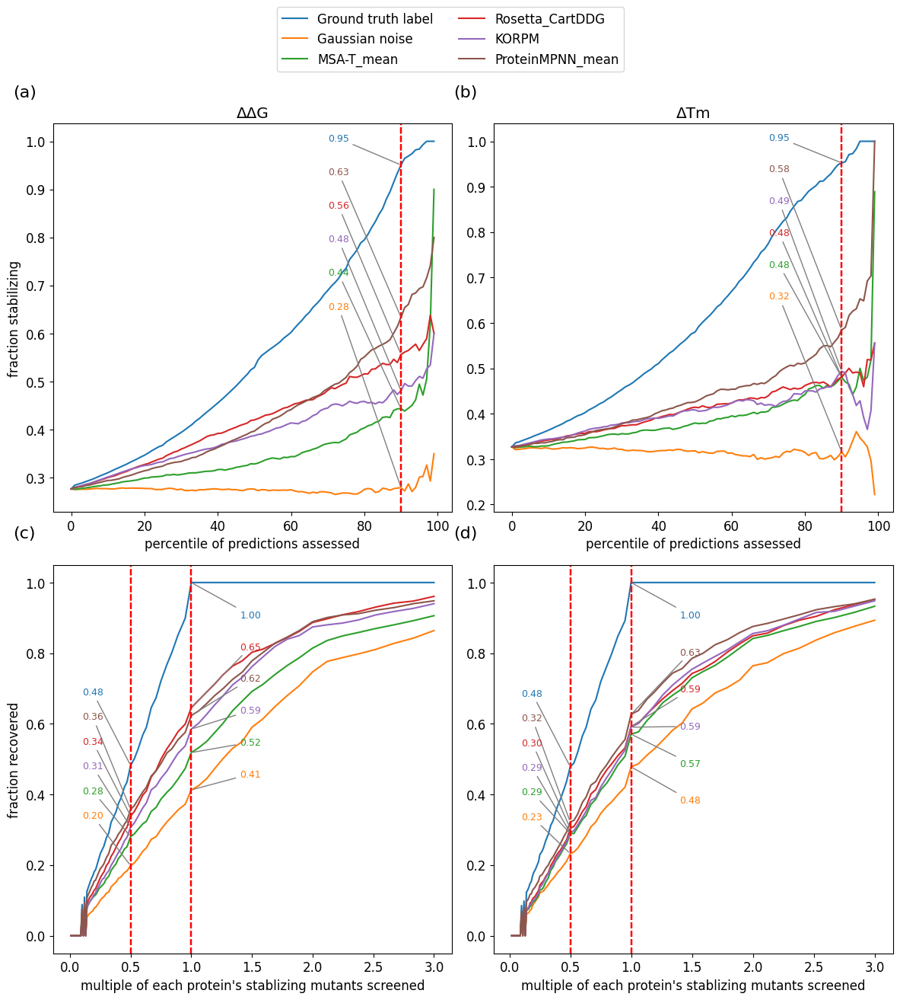

In [ ]:
# FIGURE 2

# rcv defined when generating tables above
analysis_utils.recovery_curves(rcv, ['mpnn_mean_dir', 'cartesian_ddg_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'ddG_dir', 'dTm_dir', 'random_dir'], spacing=0.07) #'mif_dir', 'esmif_multimer_full_dir',

In [ ]:
# generate ensembles for Model Complementarity section

models = ['esmif_multimer_dir', 'esmif_monomer_dir', 'mif_dir', 'mifst_dir', 
          'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mpnn_mean_dir', 
          'tranception_dir', 'esm1v_mean_dir', 'esm1v_median_dir', 
          'msa_transformer_mean_dir', 'msa_transformer_median_dir', 
          'korpm_dir', 'cartesian_ddg_dir', 
          'abs_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir'
          ]

zs_feats = ['abs_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']

db_summ = db_preds.join(db_measurements).drop('code', axis=1)#.join(db_runtimes.drop('code', axis=1))
print(len(db_summ))
#db_summ = db_summ.loc[~db_summ['ProTherm'].astype(bool)]
db_summ = db_summ.dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
print(len(db_summ))
#db_summ = db_summ.loc[db_summ['is_curated'].astype(bool)]
db_summ['ddG_dir'] = db_summ['ddG']
db_summ['dTm_dir'] = db_summ['dTm']
db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
dfm['code'] = dfm.index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfm = dfm.drop(['is_curated'], axis=1)
dfr = db_runtimes.copy(deep=True)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['abs_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = []
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        #if (model1.split('_')[0] != model2.split('_')[0]):
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
#print('saving...')
#dfm.to_csv('../../zs_suppl/preds_ensemble_fireprot_3_models.csv')
print('joining...')
#dfm = dfm.join(db_measurements[['code', 'ddG', 'dTm']], how='inner').reset_index()
dfm = dfm.join(dfr.drop('code', axis=1))

6313
6117


KeyError: 'esmif_multimer_dir'

In [ ]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../../zeroshot suppl/fireprot_summary.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns
        for extra in ['code', 'ProTherm', 'FireProt', 'is_curated', 'ThermoFluor']:
            if extra in cols:
                cols = cols.drop(extra)

    df_summ = compute_stats(db_complete[cols], stats=class_stats).reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

In [ ]:
# compute all statistics on the combined set
d1 = get_summary_df(dfm, saveloc='~/zs_suppl/ensemble_fireprot_2_models_3_weights.csv')

  0%|          | 0/2441 [00:00<?, ?it/s]

  0%|          | 0/2441 [00:00<?, ?it/s]

In [ ]:
d1 = pd.read_csv('~/zs_suppl/ensemble_fireprot_2_models_3_weights.csv').set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('weighted_ndcg', ascending=False).iloc[:20, 13:]

auroc  \
model_type model                                      class             
structural ddG_dir                                    NaN    1.000000   
           dTm_dir                                    NaN    0.946833   
           cartesian_ddg_dir + mpnn_mean_dir * 0.5    NaN    0.783892   
           cartesian_ddg_dir + mpnn_mean_dir * 1      NaN    0.767279   
           mpnn_mean_dir + cartesian_ddg_dir * 1      NaN    0.767279   
           cartesian_ddg_dir + mpnn_20_00_dir * 0.5   NaN    0.784139   
           mpnn_20_00_dir + cartesian_ddg_dir * 1     NaN    0.766921   
           cartesian_ddg_dir + mpnn_20_00_dir * 1     NaN    0.766921   
           mpnn_20_00_dir + korpm_dir * 1             NaN    0.754569   
           korpm_dir + mpnn_20_00_dir * 1             NaN    0.754569   
           mpnn_20_mean_dir + cartesian_ddg_dir * 1   NaN    0.767063   
           cartesian_ddg_dir + mpnn_20_mean_dir * 1   NaN    0.767063   
           mpnn_mean_dir + cartesian_ddg_dir * 0.5    NaN    0.746690   
           korpm_dir + mpnn_20_mean_dir * 1           NaN    0.754687   
           mpnn_20_mean_dir + korpm_dir * 1           NaN    0.754687   
           korpm_dir + mpnn_mean_dir * 1              NaN    0.755178   
           mpnn_mean_dir + korpm_dir * 1              NaN    0.755178   
           cartesian_ddg_dir + mpnn_30_noise_dir * 1  NaN    0.762839   
           mpnn_30_noise_dir + cartesian_ddg_dir * 1  NaN    0.762839   
           cartesian_ddg_dir + mpnn_20_mean_dir * 0.5 NaN    0.784043   

                                                                auprc  \
model_type model                                      class             
structural ddG_dir                                    NaN    1.000000   
           dTm_dir                                    NaN    0.856885   
           cartesian_ddg_dir + mpnn_mean_dir * 0.5    NaN    0.566030   
           cartesian_ddg_dir + mpnn_mean_dir * 1      NaN    0.552770   
           mpnn_mean_dir + cartesian_ddg_dir * 1      NaN    0.552770   
           cartesian_ddg_dir + mpnn_20_00_dir * 0.5   NaN    0.566461   
           mpnn_20_00_dir + cartesian_ddg_dir * 1     NaN    0.551355   
           cartesian_ddg_dir + mpnn_20_00_dir * 1     NaN    0.551355   
           mpnn_20_00_dir + korpm_dir * 1             NaN    0.521815   
           korpm_dir + mpnn_20_00_dir * 1             NaN    0.521815   
           mpnn_20_mean_dir + cartesian_ddg_dir * 1   NaN    0.550747   
           cartesian_ddg_dir + mpnn_20_mean_dir * 1   NaN    0.550747   
           mpnn_mean_dir + cartesian_ddg_dir * 0.5    NaN    0.530265   
           korpm_dir + mpnn_20_mean_dir * 1           NaN    0.521814   
           mpnn_20_mean_dir + korpm_dir * 1           NaN    0.521814   
           korpm_dir + mpnn_mean_dir * 1              NaN    0.524255   
           mpnn_mean_dir + korpm_dir * 1              NaN    0.524255   
           cartesian_ddg_dir + mpnn_30_noise_dir * 1  NaN    0.549623   
           mpnn_30_noise_dir + cartesian_ddg_dir * 1  NaN    0.549623   
           cartesian_ddg_dir + mpnn_20_mean_dir * 0.5 NaN    0.566108   

                                                             n_stable  \
model_type model                                      class             
structural ddG_dir                                    NaN      1380.0   
           dTm_dir                                    NaN       428.0   
           cartesian_ddg_dir + mpnn_mean_dir * 0.5    NaN      1380.0   
           cartesian_ddg_dir + mpnn_mean_dir * 1      NaN      1380.0   
           mpnn_mean_dir + cartesian_ddg_dir * 1      NaN      1380.0   
           cartesian_ddg_dir + mpnn_20_00_dir * 0.5   NaN      1380.0   
           mpnn_20_00_dir + cartesian_ddg_dir * 1     NaN      1380.0   
           cartesian_ddg_dir + mpnn_20_00_dir * 1     NaN      1380.0   
           mpnn_20_00_dir + korpm_dir * 1             NaN      1380.0   
           korpm_dir + mpnn_20_00_dir * 1      

In [ ]:
recovery_curves(d1.reset_index(), ['mpnn_mean_dir', 'cartesian_ddg_dir', 'cartesian_ddg_dir + mpnn_mean_dir * 1', 'ddG_dir', 'dTm_dir', 'random_dir'], spacing=0.07)

In [ ]:
# definition of statistics used for model combination heatmaps

def compute_weighted_ndcg(dbf, pred_col, true_col):
    cur_dbf = dbf.copy(deep=True)
    cur_dbf = cur_dbf[[pred_col, true_col]]
    cur_dbf['code'] = cur_dbf.index.str[:4]

    w_cum_ndcg = 0
    w_cum_d = 0
    for _, group in cur_dbf.groupby('code'): 
        if len(group) > 1 and not all(group[true_col]==group[true_col][0]):
            cur_ndcg = compute_ndcg(group, pred_col, true_col)
            w_cum_ndcg += cur_ndcg * np.log(len(group))
            w_cum_d += np.log(len(group))
    return w_cum_ndcg / (w_cum_d if w_cum_d > 0 else 1)


def compute_weighted_spearman(dbf, pred_col, true_col):
    cur_dbf = dbf.copy(deep=True)
    cur_dbf = cur_dbf[[pred_col, true_col]]
    cur_dbf['code'] = cur_dbf.index.str[:4]

    w_cum_p = 0
    w_cum_d = 0
    for _, group in cur_dbf.groupby('code'): 
        if len(group) > 1 and not all(group[true_col]==group[true_col][0]):
            spearman, _ = spearmanr(group[pred_col], group[true_col])
            if np.isnan(spearman):
                spearman=0
            w_cum_p += spearman * np.log(len(group))
            w_cum_d += np.log(len(group))
    return w_cum_p / (w_cum_d if w_cum_d > 0 else 1)


def compute_auprc(dbf, pred_col, true_col):
    return metrics.average_precision_score(dbf[true_col] > 0, dbf[pred_col])


def compute_t1s(dbf, pred_col, true_col):
    cur_dbf = dbf.copy(deep=True)
    cur_dbf = cur_dbf[[pred_col, true_col]]
    cur_dbf['code'] = cur_dbf.index.str[:4]

    t1s = 0
    for _, group in cur_dbf.groupby('code'): 
        t1s += group.sort_values(pred_col, ascending=False)[true_col].head(1).item()

    mean_t1s = t1s / len(cur_dbf['code'].unique())
    return mean_t1s


def compute_net_stab(dbf, pred_col, true_col):
    cur_dbf = dbf.copy(deep=True)
    cur_dbf = cur_dbf[[pred_col, true_col]]
    return cur_dbf.loc[cur_dbf[pred_col] > 0, true_col].sum()


def compute_mean_stab(dbf, pred_col, true_col):
    cur_dbf = dbf.copy(deep=True)
    cur_dbf = cur_dbf[[pred_col, true_col]]
    return cur_dbf.loc[cur_dbf[pred_col] > 0, true_col].mean()

  0%|          | 0/1000 [00:00<?, ?it/s]

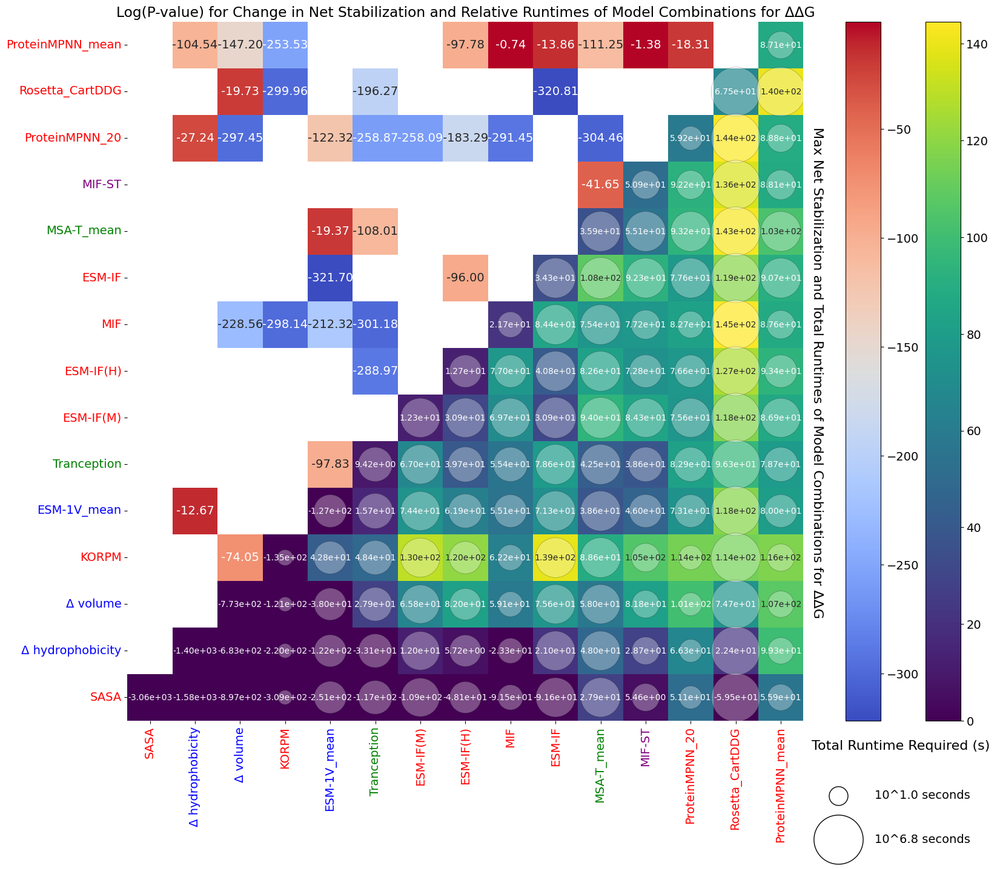

,rank,model1,weight1,model2,weight2,mean_net_stabilization,p_value
0,1,cartesian_ddg_dir,1,mif_dir,0.5,144.570525,0.0
1,1,mpnn_20_00_dir,1,cartesian_ddg_dir,1,143.629135,0.0
2,1,cartesian_ddg_dir,1,msa_transformer_mean_dir,0.2,142.666305,0.0
3,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,141.421615,0.0
4,1,mpnn_mean_dir,1,cartesian_ddg_dir,1,140.204195,0.0
...,...,...,...,...,...,...,...
520,1,abs_ASA_dir,1,delta_vol_dir,0.5,-2162.245955,0.0
521,1,abs_ASA_dir,1,korpm_dir,0.2,-2166.387265,0.0
522,1,abs_ASA_dir,1,delta_kdh_dir,0.5,-2311.76114,0.0
523,1,abs_ASA_dir,1,delta_kdh_dir,0.2,-2583.47653,0.0


In [ ]:
# Figure 3

custom_colors = {
                 'cartesian_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 'esmif_monomer_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red',
                }

measurement = 'ddG'
statistic = 'net_stabilization'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=100, threshold=0)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('~/zs_suppl/model_combinations_ddG_net_stab_nonneg_test.csv')
stat_df

In [ ]:
# SUPPLEMENTARY FIGURE 5

int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_monomer_dir',
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_mpnn_mean_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_msa_1_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm1v_2_dir',
                             'runtime_cartesian_ddg_dir',
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

hybrid = ['mifst']
evolutionary = ['tranception', 'msa_transformer_mean', 'msa_1']
sequence = ['esm1v_mean', 'esm1v_2']
structural = ['cartesian_ddg', 'esmif_multimer', 'esmif_multimer', 'esmif_monomer', 'mpnn_20_00', 'mpnn_mean', 'mif', 'korpm']

cmap = {}
for h in hybrid:
    cmap.update({h: 'purple'})
for e in evolutionary:
    cmap.update({e: 'green'})
for s in structural:
    cmap.update({s: 'red'})
for s in sequence:
    cmap.update({s: 'blue'})

hybrid_patch = Patch(color='purple', label='Hybrid')
evolutionary_patch = Patch(color='green', label='Evolutionary')
structural_patch = Patch(color='red', label='Structural')
sequence_patch = Patch(color='blue', label='Sequence')

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10))  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', palette=cmap, alpha=0.2)
ax.legend(handles=[hybrid_patch, evolutionary_patch, structural_patch, sequence_patch], title='Input', loc='upper left')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.yscale('log')
plt.ylim(10e-4, 10e4)
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('Log(runtime (s))')
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

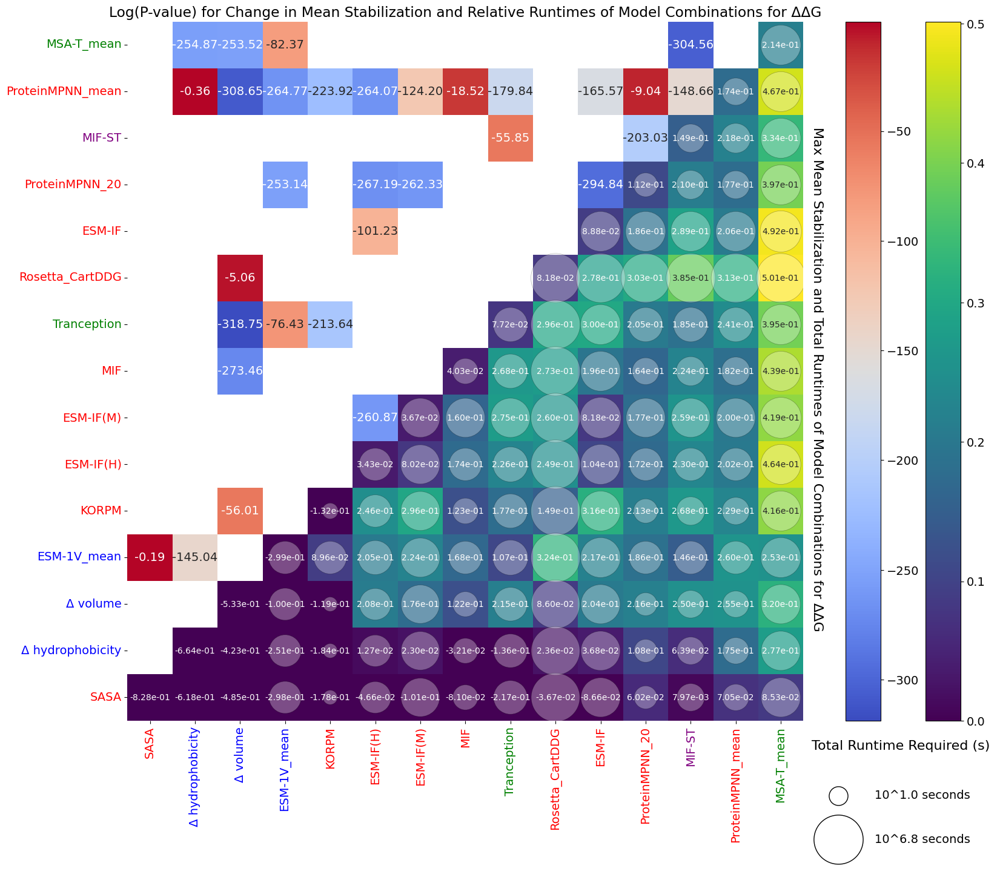

,rank,model1,weight1,model2,weight2,mean_mean_stabilization,p_value
0,1,cartesian_ddg_dir,1,msa_transformer_mean_dir,1,0.501375,0.0
1,1,esmif_multimer_full_dir,1,msa_transformer_mean_dir,0.5,0.49235,0.0
2,1,msa_transformer_mean_dir,1,cartesian_ddg_dir,0.5,0.467644,0.0
3,1,mpnn_mean_dir,1,msa_transformer_mean_dir,0.5,0.467164,0.0
4,1,msa_transformer_mean_dir,1,esmif_multimer_full_dir,1,0.467063,0.0
...,...,...,...,...,...,...,...
520,1,abs_ASA_dir,1,delta_vol_dir,0.5,-0.663419,0.0
521,1,abs_ASA_dir,1,esm1v_mean_dir,0.2,-0.664784,0.0
522,1,abs_ASA_dir,1,delta_kdh_dir,0.5,-0.69256,0.0
523,1,abs_ASA_dir,1,delta_kdh_dir,0.2,-0.738568,0.0


In [237]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'mean_stabilization'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.loc[~d3['model'].str.contains('-0.2')]
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

x_cols = [c for c in d3.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d3['aumrc <=1x'] = d3[onex_cols].mean(axis=1)

p_cols = [c for c in d3.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d3['auqrc >=80%'] = d3[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d3['auqrc >=90%'] = d3[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=1000, threshold=0)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zs_suppl/model_combinations_ddG_mean_stab_nonneg.csv')
stat_df

  0%|          | 0/1000 [00:00<?, ?it/s]

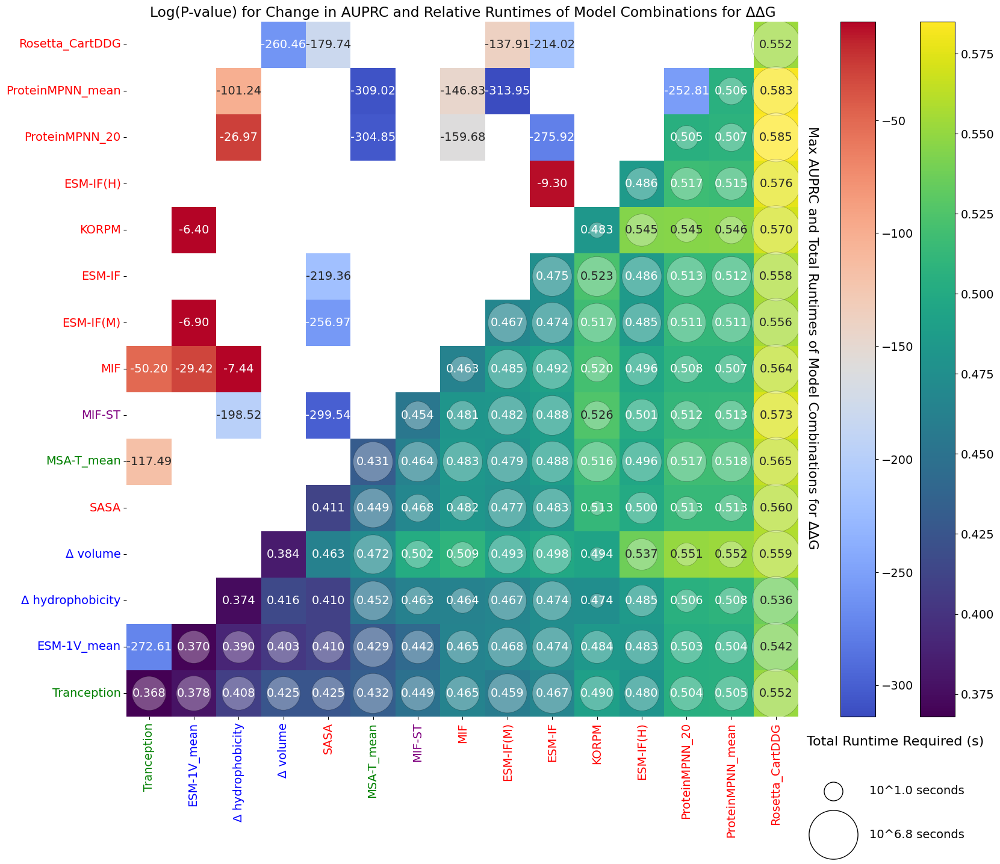

,rank,model1,weight1,model2,weight2,mean_auprc,p_value
0,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.585046,0.0
1,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.5,0.583048,0.0
2,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,0.579383,0.0
3,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.2,0.577774,0.0
4,1,cartesian_ddg_dir,1,esmif_multimer_dir,0.5,0.576129,0.0
...,...,...,...,...,...,...,...
520,1,tranception_red_dir,1,esm1v_mean_dir,1,0.378488,0.0
521,1,tranception_red_dir,1,esm1v_mean_dir,0.5,0.377755,0.0
522,1,esm1v_mean_dir,1,tranception_red_dir,0.5,0.377086,0.0
523,1,esm1v_mean_dir,1,tranception_red_dir,0.2,0.375185,0.0


In [238]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'auprc'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.loc[~d3['model'].str.contains('-0.2')]
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

x_cols = [c for c in d3.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d3['aumrc <=1x'] = d3[onex_cols].mean(axis=1)

p_cols = [c for c in d3.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d3['auqrc >=80%'] = d3[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d3['auqrc >=90%'] = d3[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=1000)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zeroshot suppl/model_combinations_ddG_auprc_nonneg.csv')
stat_df


In [239]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'weighted_ndcg'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.loc[~d3['model'].str.contains('-0.2')]
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

x_cols = [c for c in d3.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d3['aumrc <=1x'] = d3[onex_cols].mean(axis=1)

p_cols = [c for c in d3.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d3['auqrc >=80%'] = d3[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d3['auqrc >=90%'] = d3[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=1000)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zs_suppl/model_combinations_ddG_ndcg_nonneg.csv')
stat_df


  0%|          | 0/1000 [00:00<?, ?it/s]

KeyboardInterrupt: 

  0%|          | 0/100 [00:00<?, ?it/s]

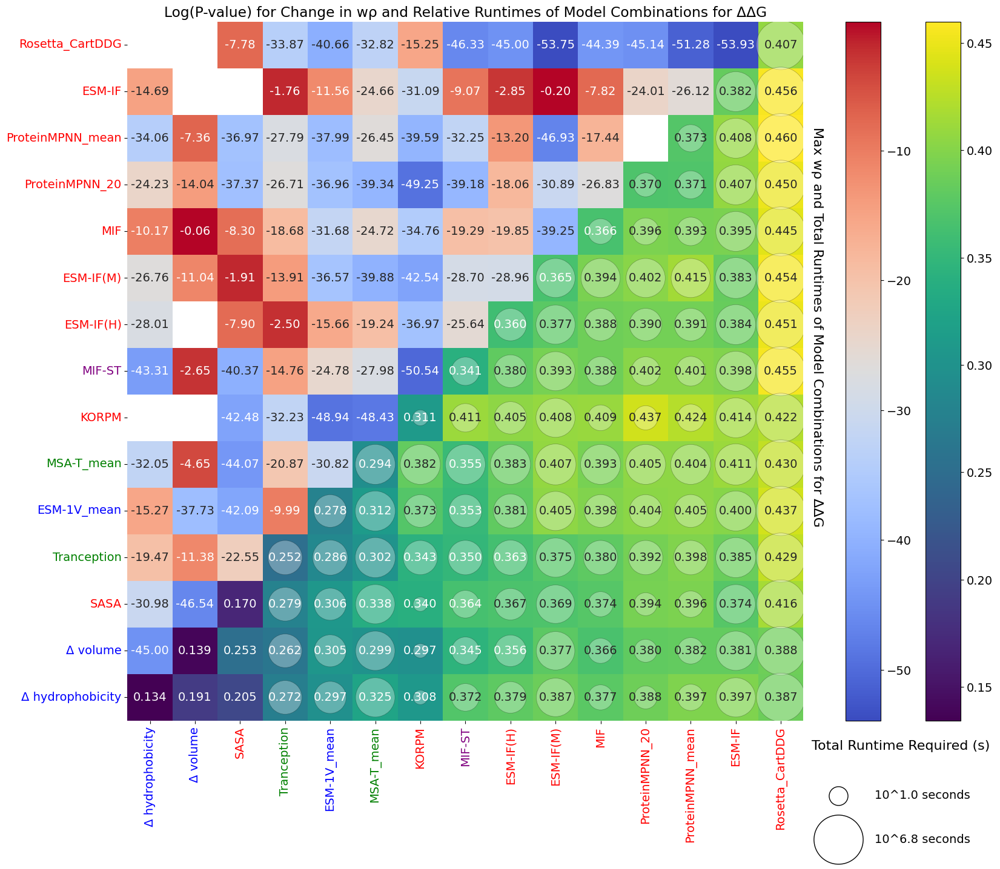

,rank,model1,weight1,model2,weight2,mean_weighted_spearman,p_value
0,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.5,0.459918,0.0
1,1,cartesian_ddg_dir,1,esmif_multimer_full_dir,0.5,0.456227,0.0
2,1,cartesian_ddg_dir,1,mifst_dir,0.5,0.455011,0.0
3,1,cartesian_ddg_dir,1,esmif_monomer_full_dir,0.5,0.453778,0.0
4,1,mpnn_mean_dir,1,cartesian_ddg_dir,1,0.453279,0.0
...,...,...,...,...,...,...,...
520,1,delta_kdh_dir,1,tranception_red_dir,0.2,0.172881,0.0
521,1,delta_kdh_dir,1,delta_vol_dir,0.5,0.172413,0.0
522,1,delta_kdh_dir,1,abs_ASA_dir,0.2,0.165353,0.157885
523,1,delta_vol_dir,1,delta_kdh_dir,0.2,0.164047,0.0


In [ ]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'weighted_spearman'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.loc[~d3['model'].str.contains('-0.2')]
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

x_cols = [c for c in d3.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d3['aumrc <=1x'] = d3[onex_cols].mean(axis=1)

p_cols = [c for c in d3.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d3['auqrc >=80%'] = d3[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d3['auqrc >=90%'] = d3[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=1000)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zeroshot suppl/model_combinations_ddG_spearman_nonneg.csv')
stat_df


  0%|          | 0/100 [00:00<?, ?it/s]

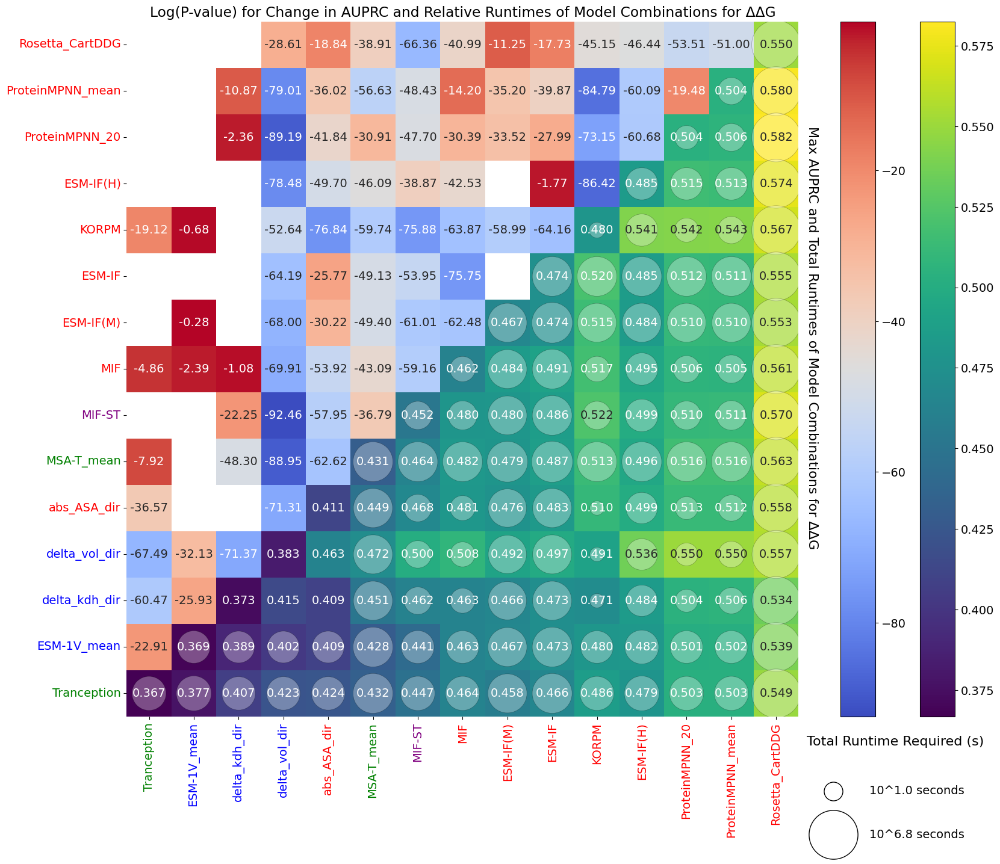

,rank,model1,weight1,model2,weight2,mean_auprc,p_value
0,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.582461,0.0
1,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.5,0.580172,0.0
2,1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,0.576538,0.0
3,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.2,0.574873,0.0
4,1,cartesian_ddg_dir,1,esmif_multimer_dir,0.5,0.573791,0.0
...,...,...,...,...,...,...,...
520,1,esm1v_mean_dir,1,tranception_red_dir,1,0.376921,0.0
521,1,tranception_red_dir,1,esm1v_mean_dir,0.5,0.376304,0.0
522,1,esm1v_mean_dir,1,tranception_red_dir,0.5,0.375413,0.0
523,1,esm1v_mean_dir,1,tranception_red_dir,0.2,0.373386,0.0


In [550]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'auprc'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.loc[~d3['model'].str.contains('-0.2')]
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])

x_cols = [c for c in d3.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d3['aumrc <=1x'] = d3[onex_cols].mean(axis=1)

p_cols = [c for c in d3.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d3['auqrc >=80%'] = d3[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d3['auqrc >=90%'] = d3[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d3, statistic, measurement, n_bootstraps=100)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zs_suppl/model_combinations_ddG_auprc_nonneg.csv')
stat_df

In [460]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 #'msa_transformer_median_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey',
                 'mpnn_mean_dir + cartesian_ddg_dir * 1': 'red',
                 'mpnn_mean_dir + korpm_dir * 1': 'red'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
db_complete = dfm.drop('code', axis=1)[list(custom_colors.keys())+['ddG', 'dTm']]
compute_stats(db_complete, stats=('n', 'mean_stabilization', 'pred_positives'), measurements=['ddG', 'dTm'])

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

runtime  \
measurement model_type   model                                 class            
dTm         evolutionary esm1v_mean_dir                                   NaN   
                         msa_transformer_mean_dir                         NaN   
                         tranception_red_dir                              NaN   
            structural   cartesian_ddg_dir                                NaN   
                         ddG_dir                                          NaN   
                         esmif_multimer_full_dir                          NaN   
                         korpm_dir                                        NaN   
                         mif_dir                                          NaN   
                         mifst_dir                                        NaN   
                         mpnn_mean_dir                                    NaN   
                         mpnn_mean_dir + cartesian_ddg_dir * 1            NaN   
                         mpnn_mean_dir + korpm_dir * 1                    NaN   
ddG         evolutionary esm1v_mean_dir                                   NaN   
                         msa_transformer_mean_dir                         NaN   
                         tranception_red_dir                              NaN   
            structural   cartesian_ddg_dir                                NaN   
                         ddG_dir                                          NaN   
                         esmif_multimer_full_dir                          NaN   
                         korpm_dir                                        NaN   
                         mif_dir                                          NaN   
                         mifst_dir                                        NaN   
                         mpnn_mean_dir                                    NaN   
                         mpnn_mean_dir + cartesian_ddg_dir * 1            NaN   
                         mpnn_mean_dir + korpm_dir * 1                    NaN   

                                                                           n  \
measurement model_type   model                                 class           
dTm         evolutionary esm1v_mean_dir                               2788.0   
                         msa_transformer_mean_dir                     2788.0   
                         tranception_red_dir                          2794.0   
            structural   cartesian_ddg_dir                            2794.0   
                         ddG_dir                                      1554.0   
                         esmif_multimer_full_dir                      2794.0   
                         korpm_dir                                    2794.0   
                         mif_dir                                      2794.0   
                         mifst_dir                                    2794.0   
                         mpnn_mean_dir                                2794.0   
                         mpnn_mean_dir + cartesian_ddg_dir * 1        2794.0   
                         mpnn_mean_dir + korpm_dir * 1                2794.0   
ddG         evolutionary esm1v_mean_dir                               5054.0   
                         msa_transformer_mean_dir                     5042.0   
                         tranception_red_dir                          5046.0   
            structural   cartesian_ddg_dir                            5058.0   
                         ddG_dir                                      5058.0   
                         esmif_multimer_full_dir                      5058.0   
                         korpm_dir                                    5058.0   
                         mif_dir                                      5058.0   
                         mifst_dir                                    5058.0   
                         mpnn_mean_dir                                5058.0   
                         mpnn_mean_dir + ca

In [501]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 #'msa_transformer_median_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey',
                 'mpnn_mean_dir + cartesian_ddg_dir * 0.5': 'red',
                 'mpnn_mean_dir + korpm_dir * 1': 'red'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
db_complete = dfm.drop('code', axis=1)[list(custom_colors.keys())+['ddG', 'dTm']]
dist = compute_stats(db_complete, stats=('n', 'tp', 'fp', 'tn', 'fn', 'mean_stabilization', 'mean_stable_pred'), measurements=['ddG', 'dTm'])
dist.to_csv('../../zeroshot suppl/model_aux_stats.csv')

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

In [515]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'weighted_auprc'

d2 = d1.copy(deep=True)

x_cols = [c for c in d2.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d2['aumrc <=1x'] = d2[onex_cols].mean(axis=1)

p_cols = [c for c in d2.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d2['auqrc >=80%'] = d2[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d2['auqrc >=90%'] = d2[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d2, statistic, measurement, n_bootstraps=100)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zs_suppl/model_combinations_ddG_wauprc.csv')
stat_df

KeyError: 'weighted_auprc'

  0%|          | 0/100 [00:00<?, ?it/s]

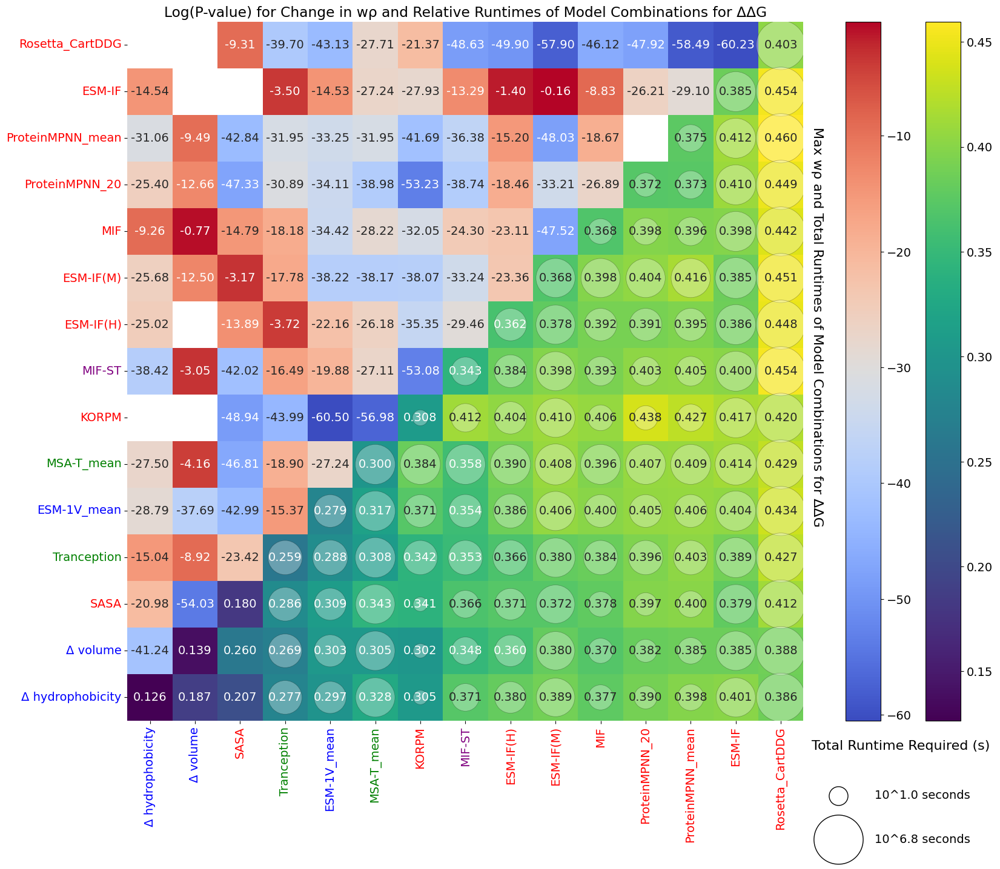

,rank,model1,weight1,model2,weight2,mean_weighted_spearman,p_value
0,1,cartesian_ddg_dir,1,mpnn_mean_dir,0.5,0.459606,0.0
1,1,mpnn_mean_dir,1,cartesian_ddg_dir,1,0.454828,0.0
2,1,cartesian_ddg_dir,1,mifst_dir,0.5,0.454483,0.0
3,1,cartesian_ddg_dir,1,esmif_multimer_full_dir,0.5,0.454204,0.0
4,1,cartesian_ddg_dir,1,esmif_monomer_full_dir,0.5,0.450539,0.0
...,...,...,...,...,...,...,...
730,1,delta_kdh_dir,1,mifst_dir,-0.2,0.035559,0.0
731,1,delta_kdh_dir,1,mif_dir,-0.2,0.034557,0.0
732,1,delta_kdh_dir,1,mpnn_20_00_dir,-0.2,0.026484,0.0
733,1,delta_kdh_dir,1,mpnn_mean_dir,-0.2,0.0222,0.0


In [495]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_monomer_full_dir': 'red',
                 'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_full_masked_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'korpm_dir': 'red',
                 'delta_kdh_dir': 'blue',
                 'delta_vol_dir': 'blue',
                 #'delta_chg_dir': 'blue',
                 'abs_ASA_dir': 'red'
                }

# Todo: Swap colors for sizes?

measurement = 'ddG'
statistic = 'weighted_spearman'

d2 = d1.copy(deep=True)

x_cols = [c for c in d2.columns if ('x_recovery' in c)]
onex_cols = [c for c in x_cols if float(c.split('x_')[0])<=1]
d2['aumrc <=1x'] = d2[onex_cols].mean(axis=1)

p_cols = [c for c in d2.columns if ('%' in c)]

eightyp_cols = [c for c in p_cols if float(c.split('%')[0])>=80]
d2['auqrc >=80%'] = d2[eightyp_cols].mean(axis=1)

ninetyp_cols = [c for c in p_cols if float(c.split('%')[0])>=90]
d2['auqrc >=90%'] = d2[ninetyp_cols].mean(axis=1)

stat_df, delta_df = model_combinations_heatmap(d2, statistic, measurement, n_bootstraps=100)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}', 'p_value']).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1

stat_df.to_csv('../../zeroshot suppl/model_combinations_ddG_spearman.csv')
stat_df

In [161]:
recovery_curves(d2.drop(['auqrc >=80%', 'auqrc >=90%'], axis=1), ['mpnn_mean_dir', 'cartesian_ddg_dir', 'cartesian_ddg_dir + mpnn_mean_dir * 0.5', 'cartesian_ddg_dir', 'ddG_dir', 'dTm_dir', 'random_dir'], spacing=0.07)

NameError: name 'd2' is not defined

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

delta_vol > 1: 827
1 >= delta_vol > -1: 815
delta_vol <= -1: 1012
['dTm_dir', 'esmif_multimer_full_dir', 'cartesian_ddg_dir', 'mif_dir', 'mpnn_mean_dir', 'mifst_dir', 'korpm_dir', 'esm1v_mean_dir', 'msa_transformer_mean_dir', 'tranception_red_dir']
class
1 >= delta_vol > -1     815
delta_vol <= -1        1012
delta_vol > 1           827
Name: n, dtype: int64


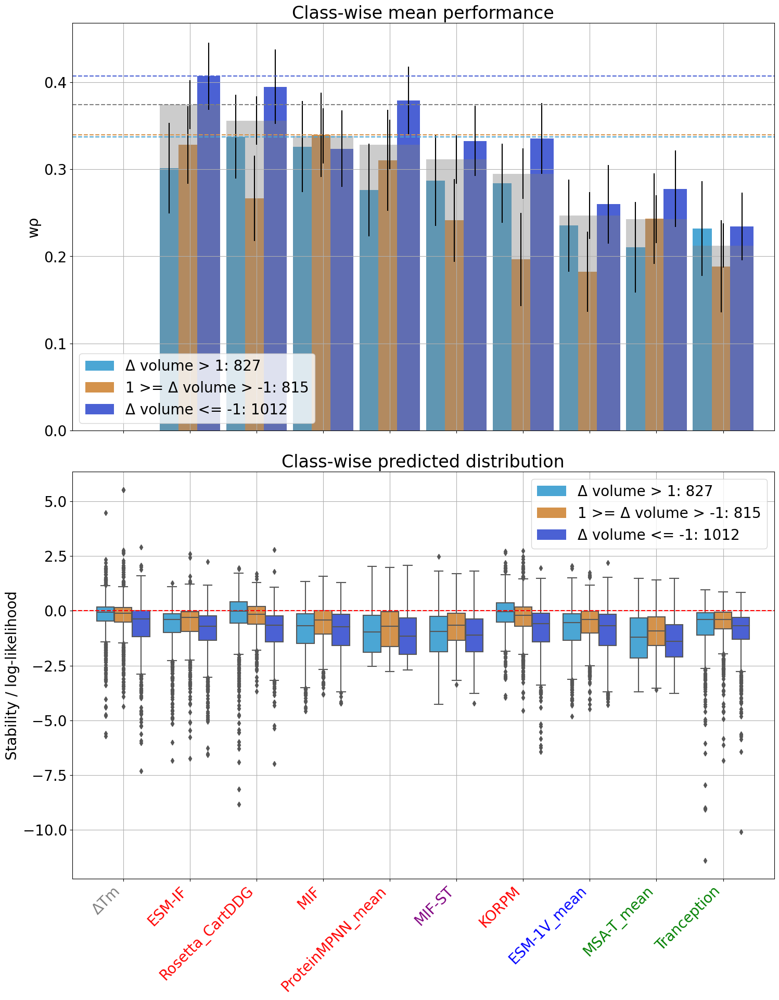

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

conservation > 70: 953
conservation <= 70: 4006
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
conservation <= 70    4006
conservation > 70      953
Name: n, dtype: int64


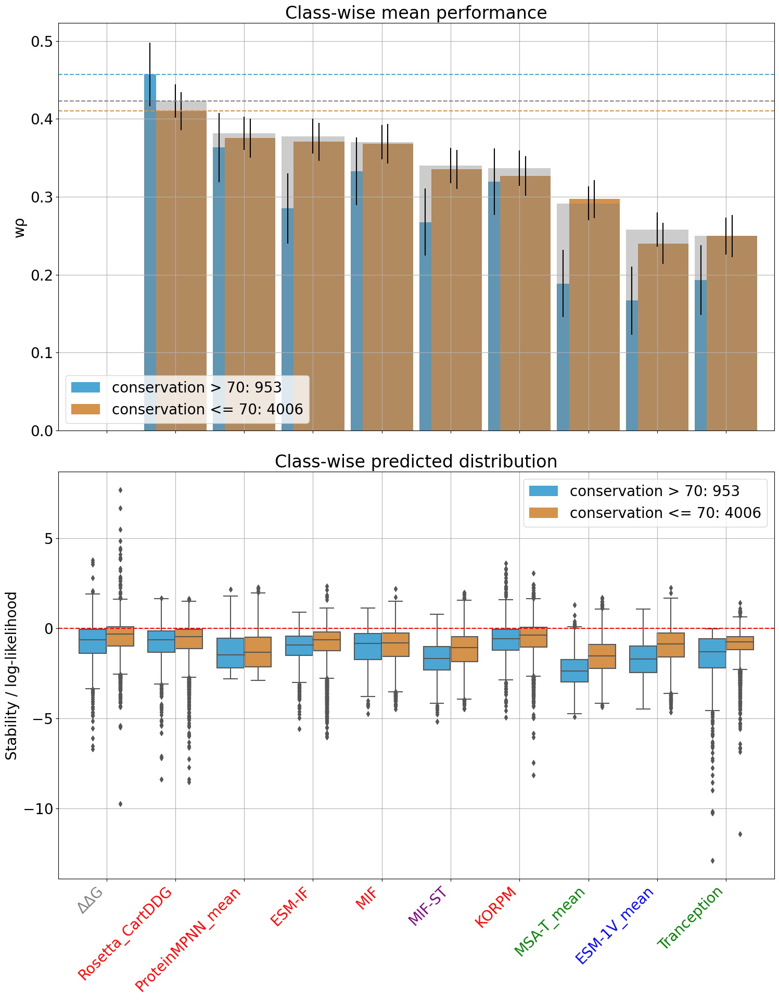

In [119]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor', 'ddG'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 70, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

In [165]:
#db_complete.loc[(db_complete['ddG'] > 0) & (db_complete['cartesian_ddg_dir'] < 0)].iloc[:, -30:].describe()

6282


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

ΔΔG > 0: 1317
0 >= ΔΔG > -2: 2409
ΔΔG <= -2: 1170
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
0 >= ΔΔG > -2    2409
ΔΔG <= -2        1170
ΔΔG > 0          1317
Name: n, dtype: int64


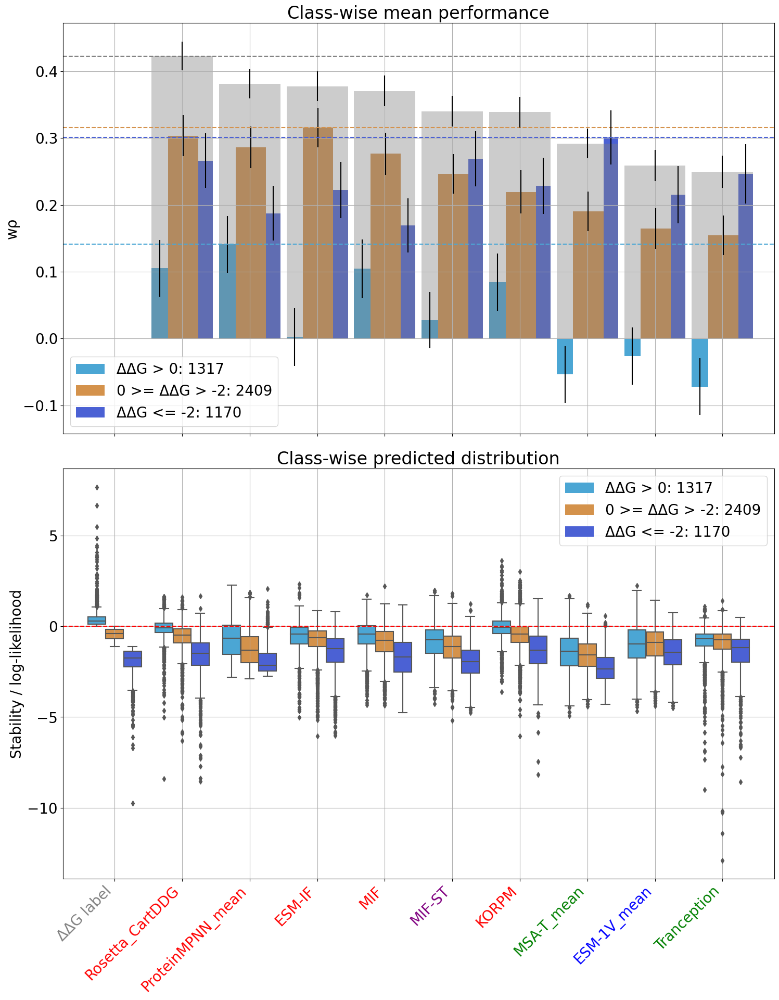

In [318]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 #'msa_transformer_median_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey',}
                 #'mpnn_mean_dir + cartesian_ddg_dir * 1': 'red',
                 #'mpnn_mean_dir + korpm_dir * 1': 'red'}


db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = db_complete.rename({'multimer': 'oligomer'}, axis=1)
#db_complete = dfm.drop('code', axis=1)[list(custom_colors.keys())+['ddG']].dropna(how='any')
print(len(db_complete))
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'ΔΔG', 
                        split_col_2 = None,
                        threshold_1 = 0, 
                        threshold_2 = -2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps = 1000,
                        count_muts = True)
# ordering and legend position

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

delta_vol > 1: 1059
1 >= delta_vol > -1: 1310
delta_vol <= -1: 2524
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
1 >= delta_vol > -1    1310
delta_vol <= -1        2524
delta_vol > 1          1059
Name: n, dtype: int64


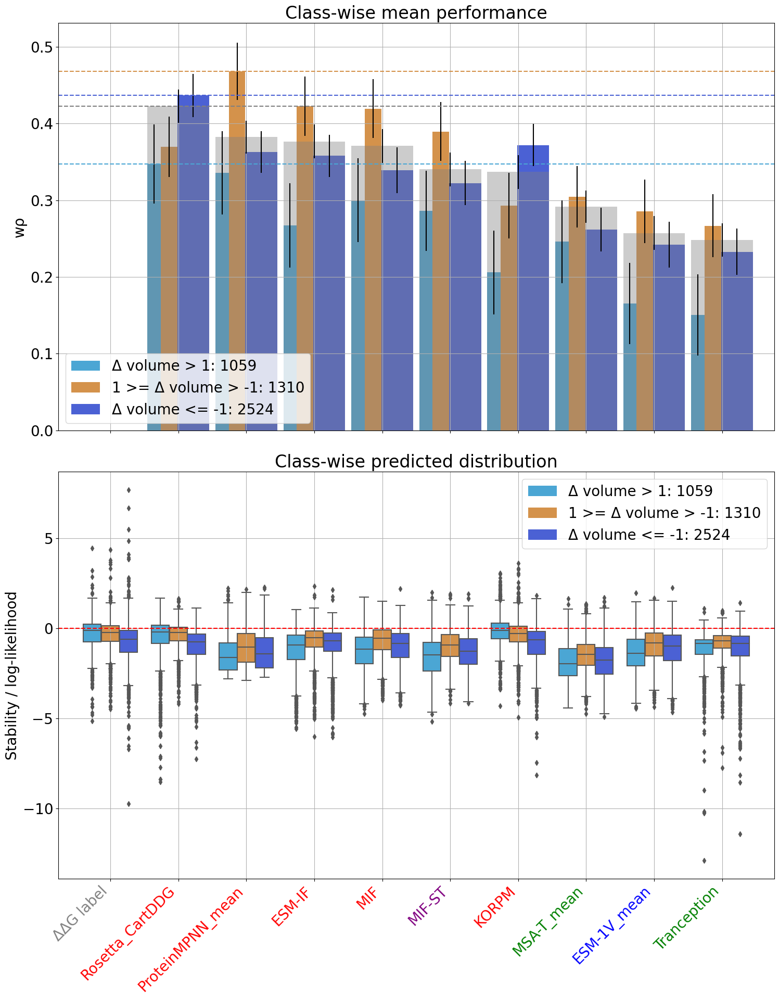

In [496]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

hbonds > 1: 2890
hbonds <= 1: 2056
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
hbonds <= 1    2056
hbonds > 1     2890
Name: n, dtype: int64


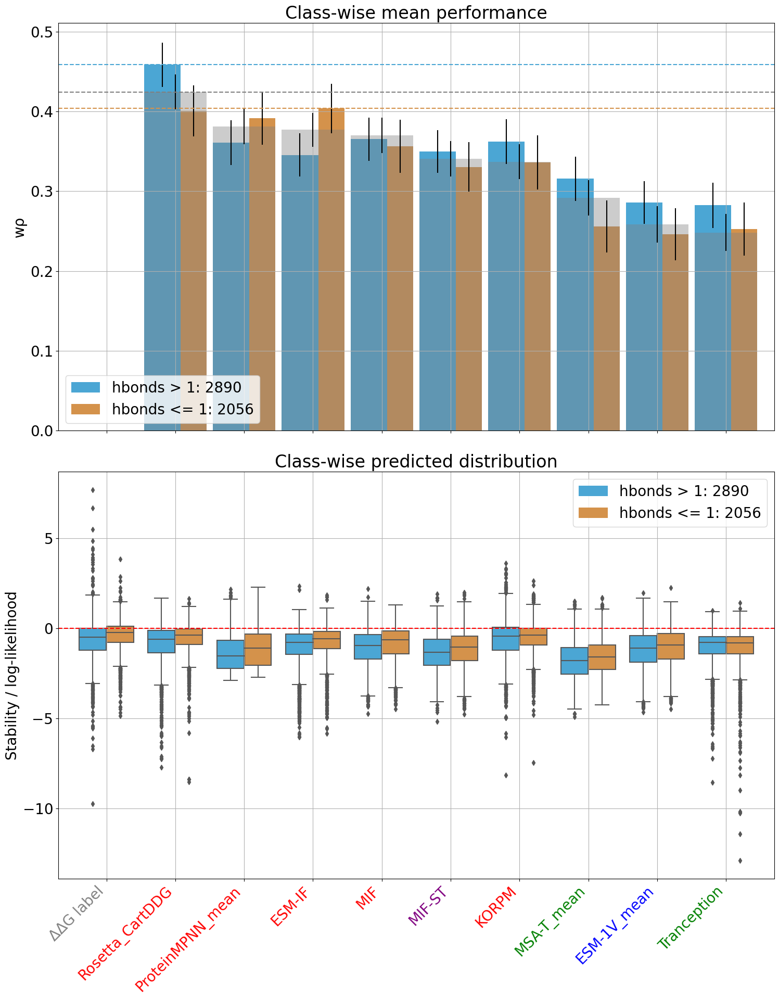

In [497]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'hbonds', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

multimer > 1: 1098
multimer <= 1: 3901
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
multimer <= 1    3901
multimer > 1     1098
Name: n, dtype: int64


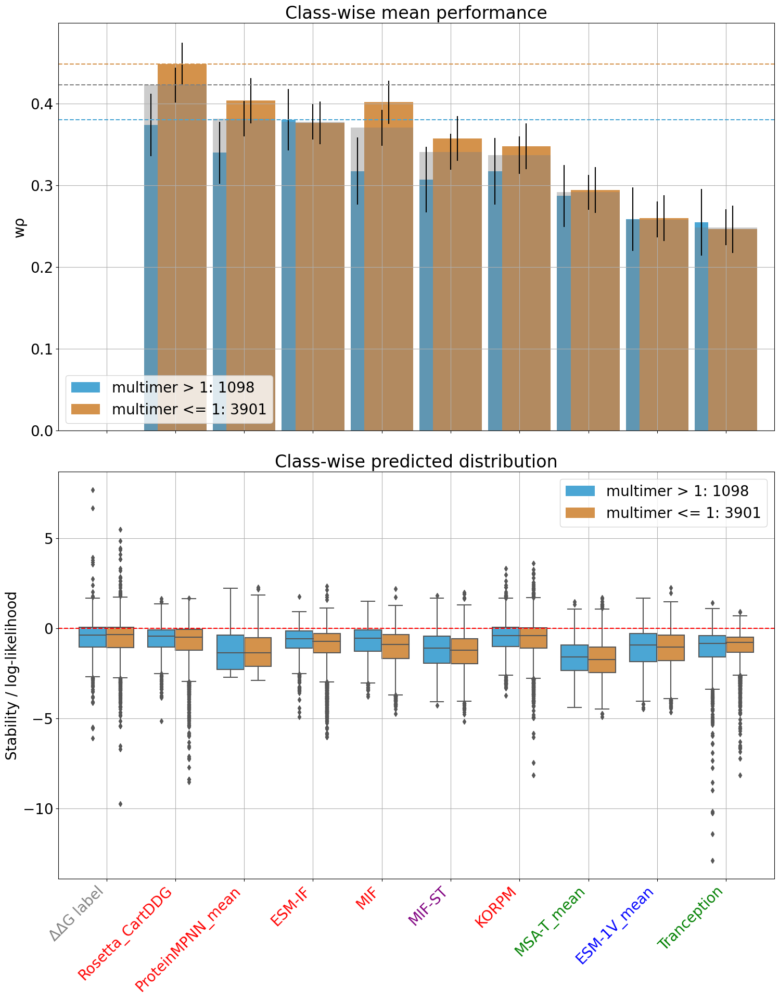

In [498]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'multimer', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

In [ ]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'entropy', 
                        split_col_2 = None, 
                        threshold_1 = 1.5, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

to_proline > 0.5: 91
to_proline <= 0.5: 4882
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
to_proline <= 0.5    4882
to_proline > 0.5       91
Name: n, dtype: int64


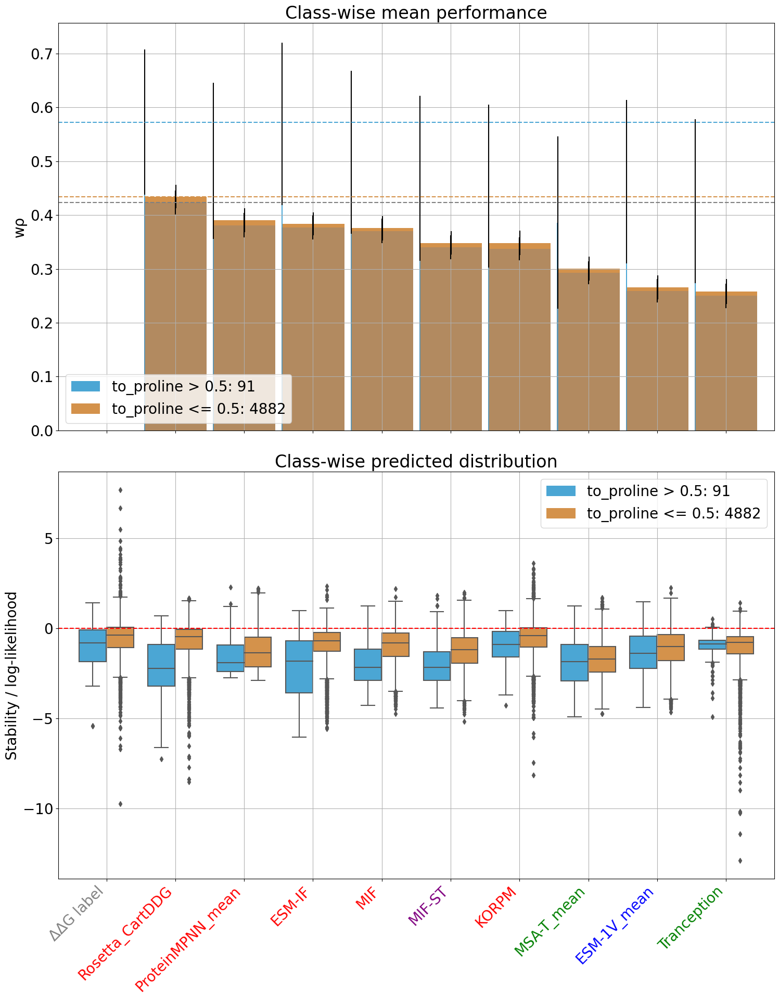

In [500]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_00_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'to_proline', 
                        split_col_2 = None, 
                        threshold_1 = 0.5, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

delta_kdh > 0 & abs_ASA > 20: 1812
delta_kdh <= 0 & abs_ASA > 20: 1201
delta_kdh > 0 & abs_ASA <= 20: 693
delta_kdh <= 0 & abs_ASA <= 20: 1129
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_dir']
class
delta_kdh <= 0 & abs_ASA <= 20    1129
delta_kdh <= 0 & abs_ASA > 20     1201
delta_kdh > 0 & abs_ASA <= 20      693
delta_kdh > 0 & abs_ASA > 20      1812
Name: n, dtype: int64


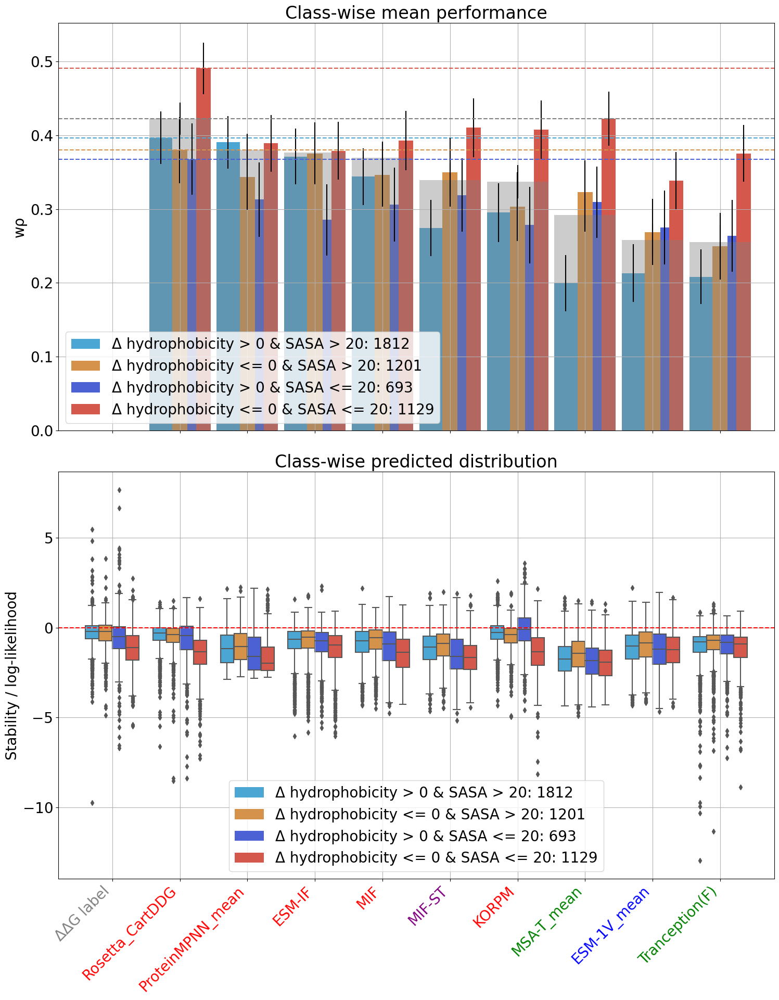

In [320]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'abs_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 20, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts=True)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

delta_kdh > 0 & abs_ASA > 20: 1863
delta_kdh <= 0 & abs_ASA > 20: 1249
delta_kdh > 0 & abs_ASA <= 20: 753
delta_kdh <= 0 & abs_ASA <= 20: 1175
['ddG_dir', 'mpnn_mean_dir', 'cartesian_ddg_dir', 'esmif_multimer_full_dir', 'mif_dir', 'korpm_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_dir']
class
delta_kdh <= 0 & abs_ASA <= 20    1175
delta_kdh <= 0 & abs_ASA > 20     1249
delta_kdh > 0 & abs_ASA <= 20      753
delta_kdh > 0 & abs_ASA > 20      1863
Name: n, dtype: int64


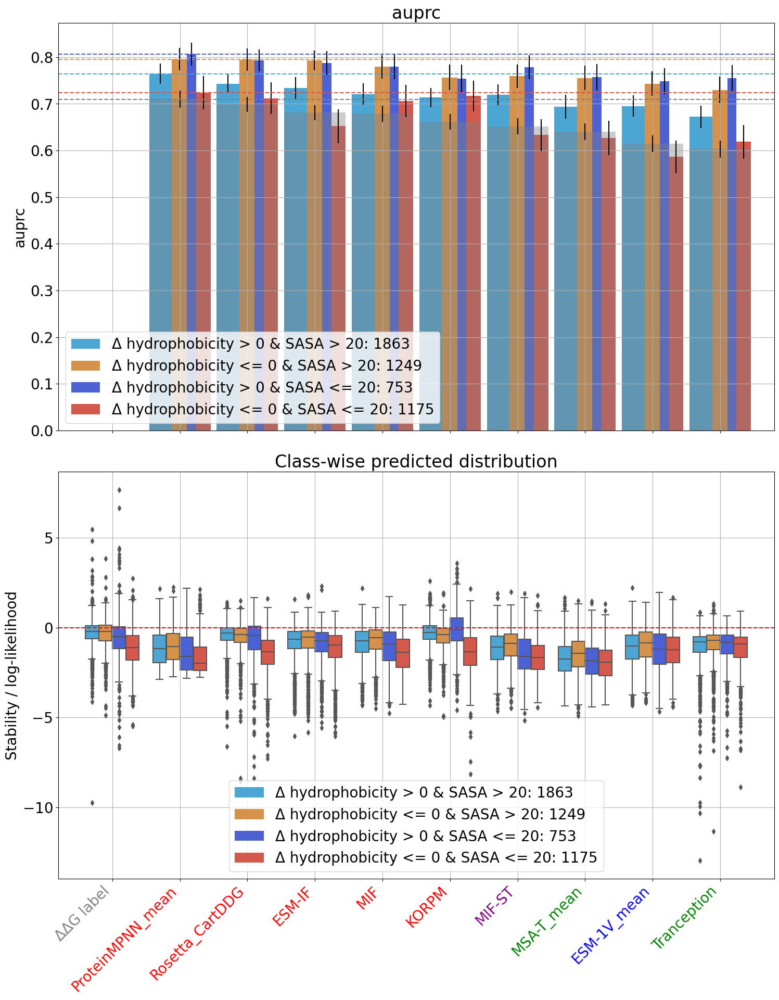

In [226]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'abs_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 20, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        n_bootstraps=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

['ddG_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_dir']
class
entropy <= 1.5    2619
entropy > 1.5     2422
Name: n, dtype: int64


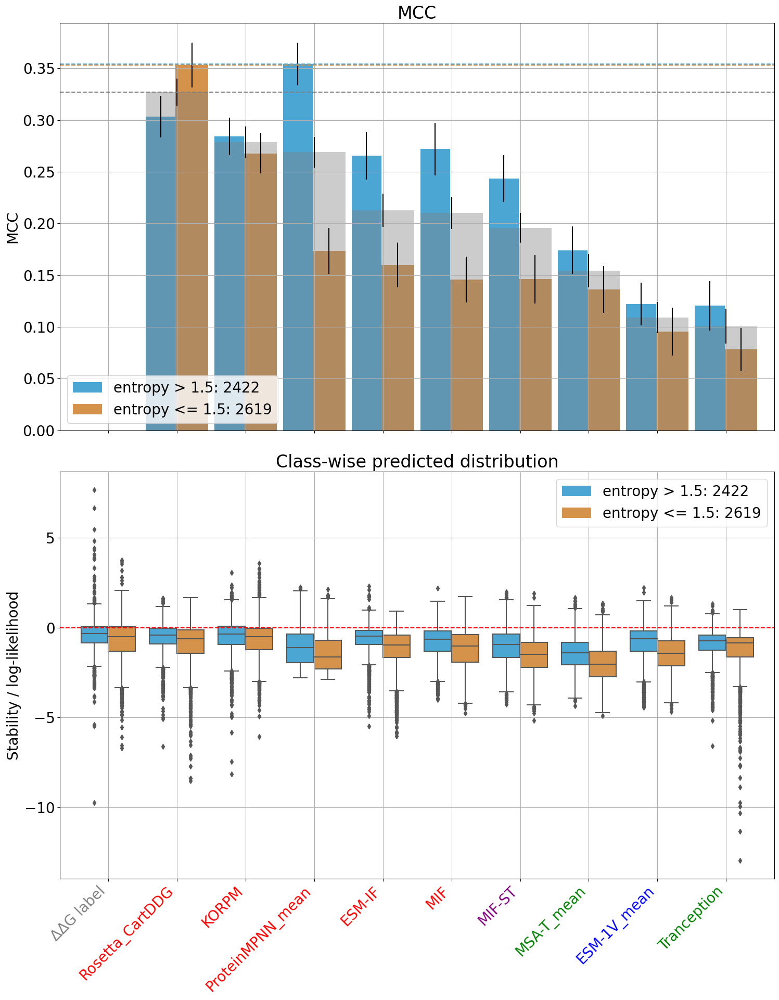

In [175]:
db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'entropy', 
                        split_col_2 = None, 
                        threshold_1 = 1.5, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'MCC',
                        n_bootstraps=100)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

['ddG_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_dir']
class
oligomer <= 1    3926
oligomer > 1     1115
Name: n, dtype: int64


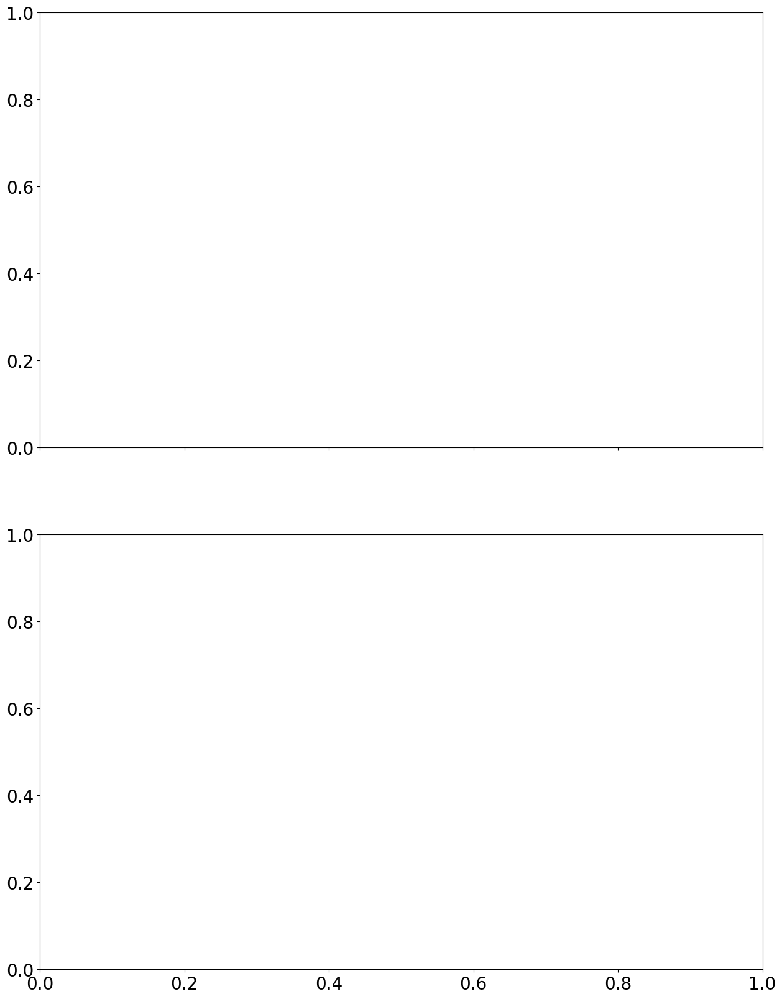

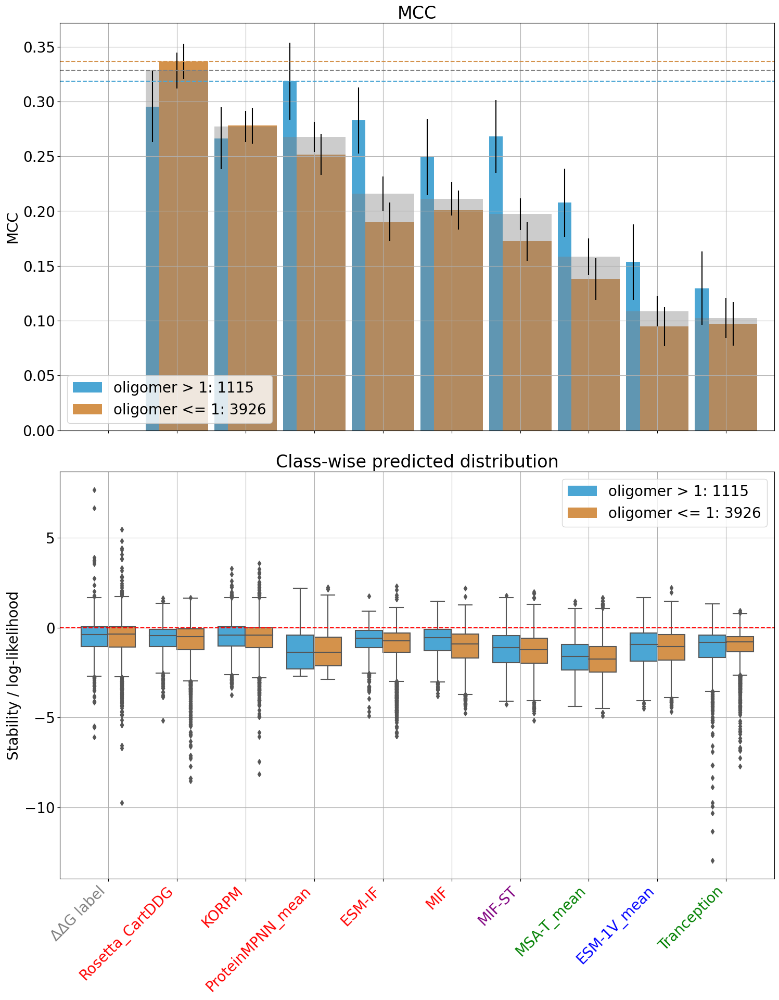

In [177]:
db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['oligomer'] = db_complete['multimer']
d = compare_performance(db_complete,
                        split_col = 'oligomer', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'MCC',
                        n_bootstraps=100)

In [207]:
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'abs_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 20, 
                        measurement = 'ddG',
                        statistic = 'MCC',
                        n_bootstraps=2)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

KeyError: ['delta_kdh', 'abs_ASA']

In [ ]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'msa_transformer_median_dir': 'green',
                 'tranception_red_dir': 'green',
                 'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}


db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
db_complete = db_complete.rename({'multimer': 'oligomer'}, axis=1)
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'ΔΔG', 
                        split_col_2 = None,
                        threshold_1 = 0, 
                        threshold_2 = -2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps = 100)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

ΔΔG > 0: 1375
0 >= ΔΔG > -2: 2453
ΔΔG <= -2: 1213
['ddG_dir', 'cartesian_ddg_dir', 'mpnn_mean_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'msa_transformer_median_dir', 'esm1v_mean_dir', 'tranception_dir', 'tranception_red_dir']
class
0 >= ΔΔG > -2    2453
ΔΔG <= -2        1213
ΔΔG > 0          1375
Name: n, dtype: int64


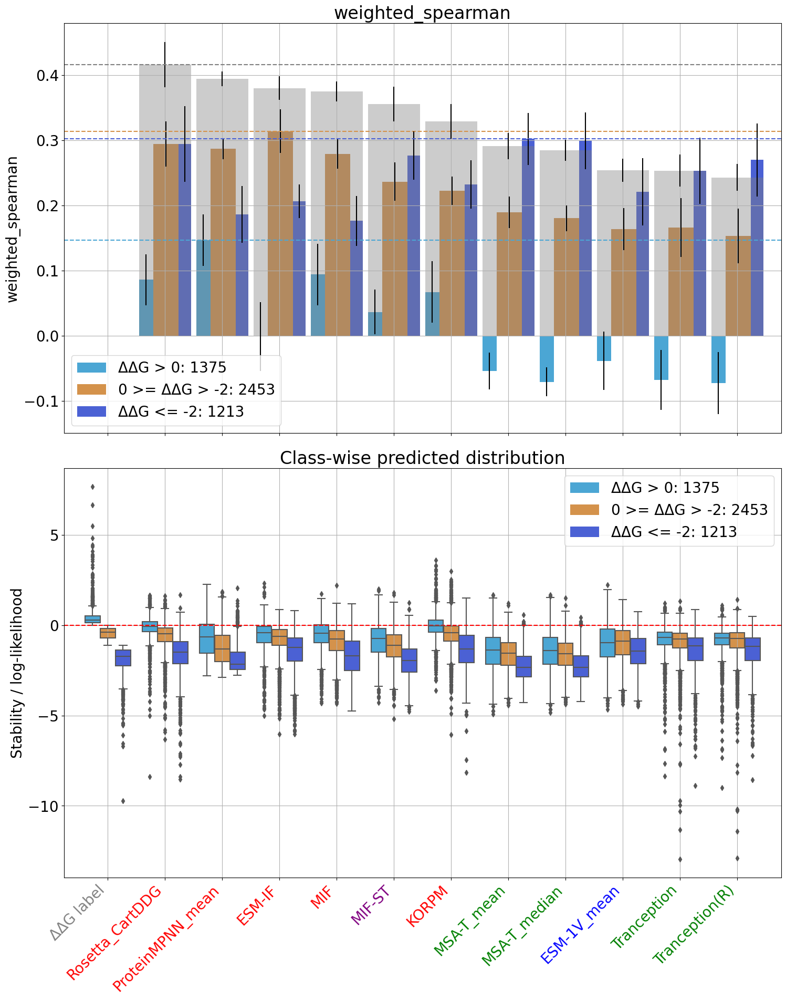

In [246]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'msa_transformer_median_dir': 'green',
                 'tranception_red_dir': 'green',
                 'tranception_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 #'mpnn_20_00_dir': 'red',
                 #'mpnn_20_mean_dir': 'red',
                 #'mpnn_30_noise_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}


db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
db_complete = db_complete.rename({'multimer': 'oligomer'}, axis=1)
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'ΔΔG', 
                        split_col_2 = None,
                        threshold_1 = 0, 
                        threshold_2 = -2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps = 10)

In [774]:
db_feats_2.columns

Index(['on_interface', 'entropy', 'conservation', 'column_completeness',
       'completeness_score', 'n_seqs', 'structure_length', 'multimer',
       'hbonds', 'saltbrs', 'b_factor', 'residue_depth', 'abs_ASA', 'asa',
       'rel_ASA', 'binding', 'delta_kdh', 'delta_vol', 'delta_chg',
       'to_proline', 'to_glycine', 'from_proline', 'from_glycine',
       'to_alanine', 'helix', 'bend', 'turn', 'coil', 'strand', 'active_site',
       'sequence_length', 'neff', 'ProTherm', 'FireProt', 'is_curated'],
      dtype='object')

['dTm_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_full_dir', 'esm1v_mean_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'tranception_red_dir', 'mifst_dir', 'cartesian_ddg_dir']
class
multimer <= 1.0 & ThermoFluor <= 0.5    318.0
multimer <= 1.0 & ThermoFluor > 0.5      17.0
multimer > 1.0 & ThermoFluor <= 0.5     114.0
multimer > 1.0 & ThermoFluor > 0.5      545.0
Name: n, dtype: float64


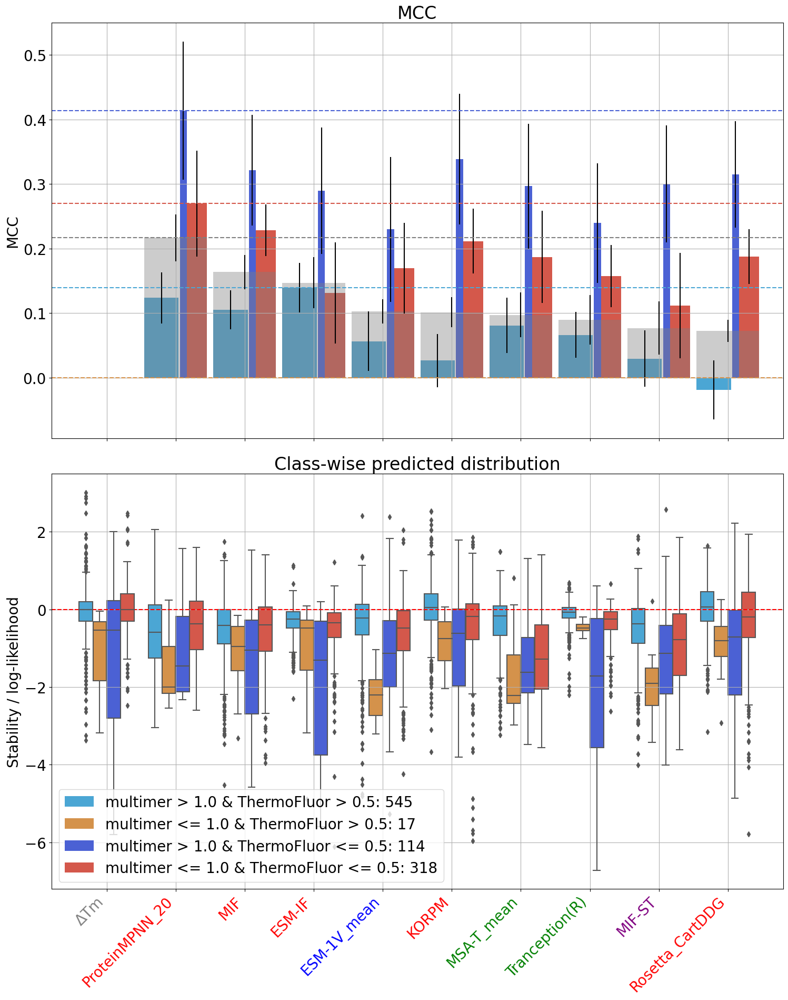

In [803]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'dTm_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['dTm_dir'] = db_complete['dTm']
d = compare_performance(db_complete,
                        split_col = 'multimer', 
                        split_col_2 = 'ThermoFluor', 
                        threshold_1 = 1., 
                        threshold_2 = 0.5, 
                        measurement = 'dTm',
                        statistic = 'MCC',
                        n_bootstraps = 10)

['dTm_dir', 'mpnn_20_00_dir', 'esmif_monomer_full_dir', 'mif_dir', 'esmif_multimer_full_dir', 'esm1v_mean_dir', 'korpm_dir', 'msa_transformer_mean_dir', 'cartesian_ddg_dir', 'tranception_red_dir', 'mifst_dir']
class
abs_ASA <= 40 & delta_kdh <= 0    272.0
abs_ASA <= 40 & delta_kdh > 0     258.0
abs_ASA > 40 & delta_kdh <= 0     266.0
abs_ASA > 40 & delta_kdh > 0      195.0
Name: n, dtype: float64


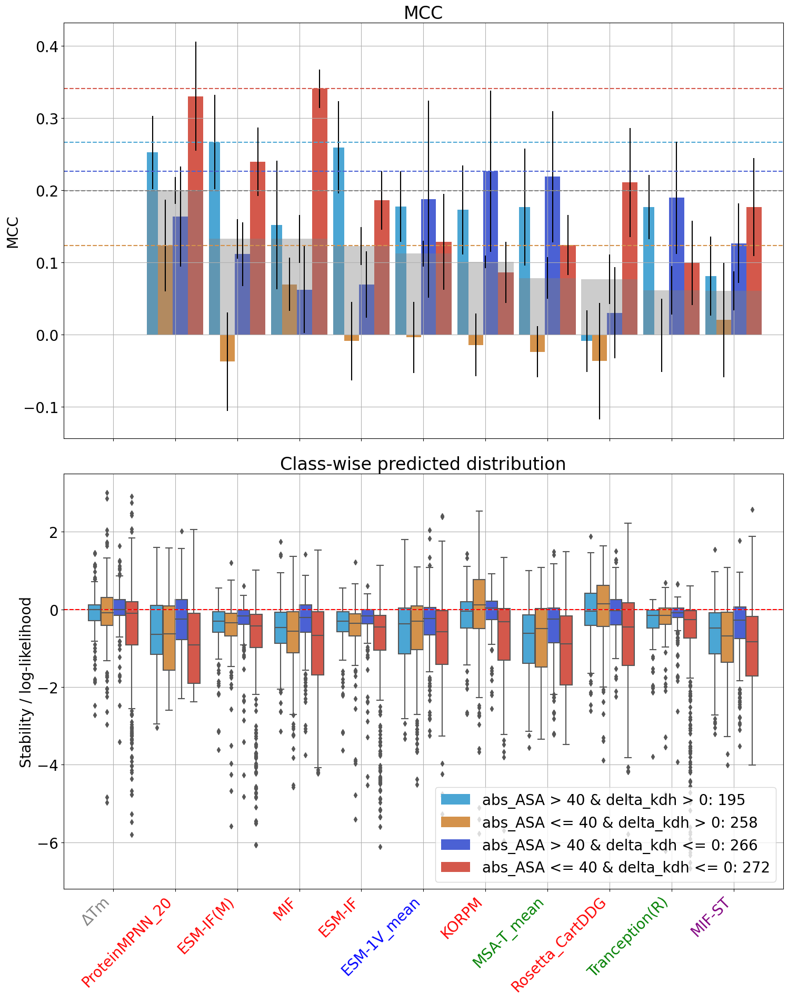

In [726]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 'esmif_monomer_full_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'dTm_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['dTm_dir'] = db_complete['dTm']
d = compare_performance(db_complete,
                        split_col = 'abs_ASA', 
                        split_col_2 = 'delta_kdh', 
                        threshold_1 = 40, 
                        threshold_2 = 0, 
                        measurement = 'dTm',
                        statistic = 'MCC',
                        n_bootstraps = 5)

['ddG_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'mif_dir', 'esmif_multimer_full_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
entropy <= 1.5 & neff <= 100     994.0
entropy <= 1.5 & neff > 100     1616.0
entropy > 1.5 & neff <= 100      236.0
entropy > 1.5 & neff > 100      2224.0
Name: n, dtype: float64


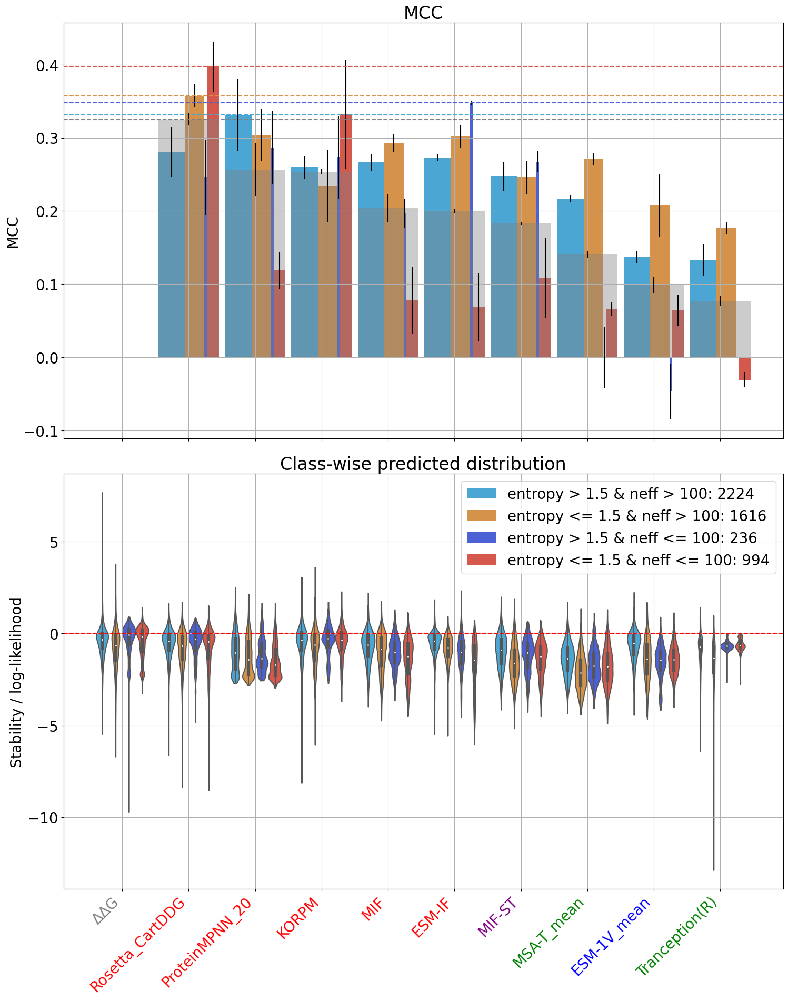

In [700]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'entropy', 
                        split_col_2 = 'neff', 
                        threshold_1 = 1.5, 
                        threshold_2 = 100, 
                        measurement = 'ddG',
                        statistic = 'MCC',
                        n_bootstraps=2)

['ddG_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esmif_multimer_full_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
80 >= abs_ASA > 20    1839.0
abs_ASA <= 20         1914.0
abs_ASA > 80          1316.0
Name: n, dtype: float64


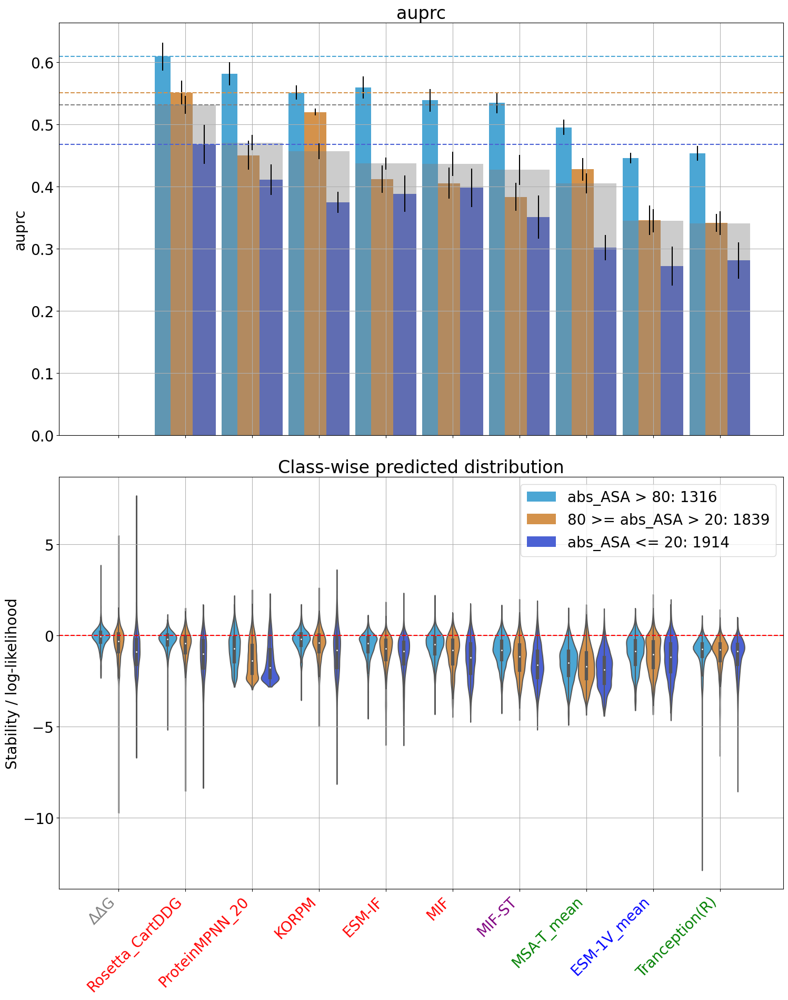

In [710]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'ddG_dir': 'grey'}
db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['ddG_dir'] = db_complete['ddG']
d = compare_performance(db_complete,
                        split_col = 'abs_ASA', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = 20, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        n_bootstraps=5)

['dTm_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_full_dir', 'korpm_dir', 'cartesian_ddg_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm1v_mean_dir', 'tranception_red_dir']
class
entropy <= 1.5 & neff <= 100      32.0
entropy <= 1.5 & neff > 100      956.0
entropy > 1.5 & neff <= 100       25.0
entropy > 1.5 & neff > 100      1793.0
Name: n, dtype: float64


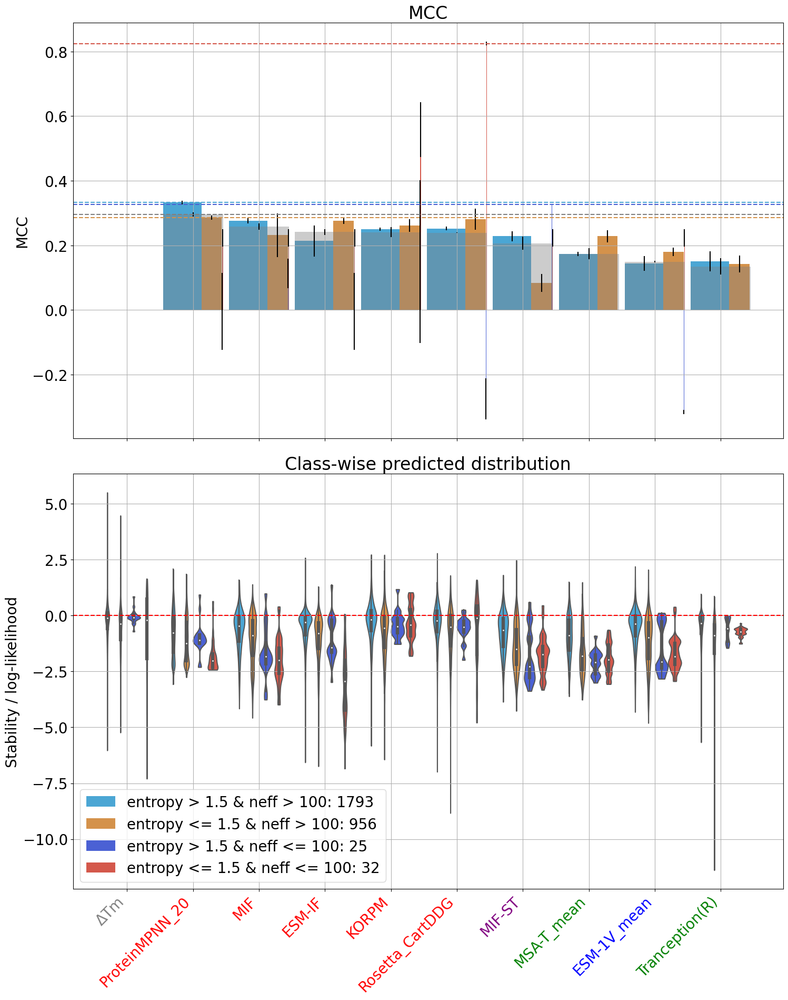

In [701]:
custom_colors = {#'cartesian_ddg_dir + esmif_multimer_dir * 0.5': 'black',
                 #'mpnn_20_00_dir + esmif_multimer_dir * 1': 'black',
                 'cartesian_ddg_dir': 'red',
                 #'monomer_ddg_dir': 'red',
                 'korpm_dir': 'red',
                 'esm1v_mean_dir': 'blue',
                 'msa_transformer_mean_dir': 'green',
                 'tranception_red_dir': 'green',
                 #'esmif_monomer_dir': 'red',
                 #'esmif_multimer_dir': 'red',
                 'esmif_multimer_full_dir': 'red',
                 #'esmif_monomer_masked_dir': 'red',
                 #'mpnn_mean_dir': 'red',
                 #'mpnn_10_00_dir': 'red',
                 'mpnn_20_00_dir': 'red',
                 #'mpnn_20_02_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 #'mpnn_30_03_dir': 'red',
                 'mif_dir': 'red',
                 'mifst_dir': 'purple',
                 'dTm_dir': 'grey'}

db_complete = db_preds.join(db_measurements, how='left').drop(['ProTherm', 'FireProt', 'is_curated'], axis=1).join(db_feats_2, how='left').drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir').dropna(subset='msa_transformer_mean_dir')
#db_complete = dfm.drop(['ProTherm', 'FireProt'], axis=1).join(db_feats_2, how='left').drop(['code'], axis=1)
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]
db_complete['dTm_dir'] = db_complete['dTm']
d = compare_performance(db_complete,
                        split_col = 'entropy', 
                        split_col_2 = 'neff', 
                        threshold_1 = 1.5, 
                        threshold_2 = 100, 
                        measurement = 'dTm',
                        statistic = 'MCC',
                        n_bootstraps=2)

In [ ]:
#distributions dont really change even though true distribution does

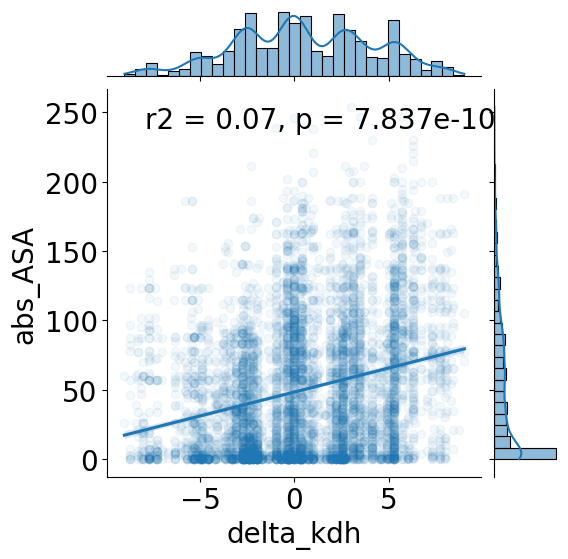

In [751]:
# Calculate r2 and p-value

cur_feats = db_feats_2[['delta_kdh', 'abs_ASA']].dropna()
slope, intercept, r_value, p_value, std_err = linregress(cur_feats['delta_kdh'].dropna(), cur_feats['abs_ASA'].dropna())

# Create a seaborn jointplot with regression line
g = sns.jointplot(data=cur_feats, y='abs_ASA', x='delta_kdh', kind='reg', joint_kws={'scatter_kws': {'alpha':0.05}, 'line_kws': {'alpha':1}})

# Add r2 and p-value to the plot
g.ax_joint.text(0.1, 0.9, 'r2 = {:.2f}, p = {:.3e}'.format(r_value**2, p_value), transform=g.ax_joint.transAxes)

plt.show()


In [78]:
# load features from features.py
db_feats_2 = pd.read_csv('~/final/fireprot_mapped_feats.csv')

neff = pd.read_csv(os.path.join(path, '..', 'neff.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff']
neff = neff.groupby(level=0).max()

# preprocess raw features
db_feats_2['uid'] = db_feats_2['code'] + '_' + db_feats_2['position'].astype(str) + db_feats_2['mutation']
db_feats_2 = db_feats_2.set_index('uid')
db_feats_2 = db_feats_2[['code', 'wild_type', 'mutation', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'residue_depth', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'asa']]
db_feats_2 = db_feats_2.rename({'rel_ASA': 'abs_ASA'}, axis=1)
db_feats_2['rel_ASA'] = db_feats_2['abs_ASA']
db_feats_2['on_interface'] = db_feats_2['on_interface'].astype(int)
db_feats_2['features'] = db_feats_2['features'].fillna("")
db_feats_2['binding'] = db_feats_2['features'].str.contains('BINDING')
db_feats_2['delta_kdh'] = db_feats_2['kdh_mut'] - db_feats_2['kdh_wt']
db_feats_2['delta_vol'] = db_feats_2['vol_mut'] - db_feats_2['vol_wt']
db_feats_2['delta_chg'] = db_feats_2['chg_mut'] - db_feats_2['chg_wt']
db_feats_2['to_proline'] = db_feats_2['mutation'] == 'P'
db_feats_2['to_glycine'] = db_feats_2['mutation'] == 'G'
db_feats_2['from_proline'] = db_feats_2['wild_type'] == 'P'
db_feats_2['from_glycine'] = db_feats_2['wild_type'] == 'G'
db_feats_2['to_alanine'] = db_feats_2['mutation'] == 'A'
db_feats_2['helix'] = db_feats_2['SS'] == 'H'
db_feats_2['bend'] = db_feats_2['SS'] == 'S'
db_feats_2['turn'] = db_feats_2['SS'] == 'T'
db_feats_2['coil'] = db_feats_2['SS'] == '-'
db_feats_2['strand'] = db_feats_2['SS'] == 'E'
db_feats_2['active_site'] = db_feats_2['features'].str.contains('ACT_SITE')
db_feats_2 = db_feats_2.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type', 'mutation'], axis=1)
#db_feats_2.loc[db.index, 'sequence_length'] = db['sequence_length']
db_feats_2 = db_feats_2.reset_index().merge(neff, on='code', how='left').drop('code', axis=1).set_index('uid')
db_feats_2 = db_feats_2.join(db_measurements[['ProTherm', 'FireProt', 'is_curated', 'ThermoFluor', 'ddG']])#.join(db_feats, rsuffix='_fp', how='inner')
print(len(db_feats_2))
db_feats_2['ProTherm']

db_feats_2['neff'] = db_feats_2['neff'].fillna(0)
fp_feats = db_feats_2
fp_feats['neff'] = fp_feats['neff'].fillna(0)
fp_feats['rel_ASA']

6313


uid
1A23_170A     21.0
1A23_49S      21.0
1A23_51L      58.0
1A23_51S      58.0
1A23_51Y      58.0
             ...  
6TQ3_97A      46.0
6TQ3_97K      46.0
6TQ3_9P       78.0
8TIM_179A    124.0
8TIM_193A     94.0
Name: rel_ASA, Length: 6313, dtype: float64

In [77]:
def extract_decimal_number(text):
    # Define a regular expression to match decimal numbers
    decimal_regex = r"\d+\.\d+"
    
    # Search for the decimal number in the text using the regular expression
    match = re.search(decimal_regex, text)
    
    # If a match is found, return the float value of the matched string
    if match:
        return float(match.group())
    
    # If no match is found, return NaN
    return np.nan

db = pd.read_csv(os.path.join(path, '..', 's669_mapped_preds_korpm.csv'))

db['uid2'] = db['code'] + '_' + (db['position'].astype(int) - db['offset_up'].astype(int)).astype(str) + db['mutation'].str[-1]
db = db.set_index(['uid', 'uid2'])

cols = db.columns
drop = [col for col in db.columns if 'Unnamed' in col]
drop += [col for col in db.columns if 'pdb' in col]
drop += [col for col in db.columns if 'offset' in col]

db_full = db.copy(deep=True)
db_full['uid3'] = db['code'] + '_' + db['PDB_Mut'].str[1:]
db_full = db_full.reset_index().set_index('uid3')

s461 = pd.read_csv(os.path.join(path, '..', 'S461.csv'))
s461['uid3'] = s461['PDB'] + '_' + s461['MUT_D'].str[2:]
s461 = s461.set_index('uid3')
s461['ddG_I'] = -s461['ddG_D']

s461.columns = [s+'_dir' for s in s461.columns]
s461 = s461.rename({'ddG_D_dir': 'ddG_dir', 'ddG_I_dir': 'ddG_inv'}, axis=1)


db = s461.join(db_full, how='left').reset_index(drop=True).set_index(['uid', 'uid2'])
#db.to_csv(os.path.join(path, '..', 'S461_joined.csv'))
db = db.drop(drop, axis=1)
db = db.drop(['PDB_dir', 'MUT_D_dir'], axis=1)

db_complete = db.copy(deep=True).reset_index()
db_complete = db_complete.set_index('uid').drop(['multimer', 'nmr_xray', 'pH', 'resolution', 'wild_type'], axis=1)

neff = pd.read_csv(os.path.join(path, '..', 'neff.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff']

db_feats_2 = pd.read_csv(os.path.join(path, '..', 's669_mapped_feats.csv'))
db_feats_2['uid'] = db_feats_2['code'] + '_' + db_feats_2['position'].astype(str) + db_feats_2['mutation']
db_feats_2 = db_feats_2[['uid', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'residue_depth', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'nmr_xray', 'pH', 'resolution']]

db_feats_2['on_interface'] = db_feats_2['on_interface'].astype(int)
db_feats_2['features'] = db_feats_2['features'].fillna("")#.apply(list)
#db_complete = db_complete.join(ddgs)
db_complete = db_complete.join(db_feats_2.set_index('uid')).drop('code', axis=1)
db_complete['delta_kdh'] = db_complete['kdh_mut'] - db_complete['kdh_wt']
db_complete['delta_vol'] = db_complete['vol_mut'] - db_complete['vol_wt']
db_complete['delta_chg'] = db_complete['chg_mut'] - db_complete['chg_wt']
db_complete['delta_asa'] = db_complete['SOL_ACC_inv'] - db_complete['SOL_ACC_dir']
db_complete['to_proline'] = (db_complete.index.str[-1] == 'P').astype(int)
db_complete['to_glycine'] = (db_complete.index.str[-1] == 'G').astype(int)
db_complete['from_proline'] = db_complete['wild_type'] == 'P'
db_complete['from_glycine'] = db_complete['wild_type'] == 'G'
db_complete['helix'] = db_complete['SS'] == 'H'
db_complete['bend'] = db_complete['SS'] == 'S'
db_complete['turn'] = db_complete['SS'] == 'T'
db_complete['coil'] = db_complete['SS'] == '-'
db_complete['strand'] = db_complete['SS'] == 'E'
db_complete['xray_else_NMR'] = db_complete['nmr_xray'].str.contains('X-RAY')
db_complete['active_site'] = db_complete['features'].str.contains('ACT_SITE')
db_complete['resolution'] = db_complete['resolution'].fillna('').apply(lambda x: extract_decimal_number(x))
#db_complete['mpnn_median_dir'] = db_complete[['mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir']].mean(axis=1)
db_complete = db_complete.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type', 'nmr_xray'], axis=1)
# 'mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir', 'mpnn_10_dir', 'mpnn_30_dir', 'mpnn_30_03_dir', 'mpnn_20_02_dir',
db_complete['code'] = db_complete.index.str[:4]
db_complete = db_complete.reset_index().merge(neff['neff'].dropna(), on='code', how='left')#.drop('code', axis=1)#.set_index('uid')
db_complete['neff'] = db_complete['neff'].fillna(0)
unique_indices = db_complete.groupby('uid')['neff'].idxmax()#.astype(int)
db_complete = db_complete.loc[unique_indices].set_index('uid')

db_complete['random_dir'] = np.random.rand(len(db_complete)) - 0.5
db_complete['random_inv'] = np.random.rand(len(db_complete)) - 0.5
db_complete = db_complete.rename({'ddG_dir': 'ddG'}, axis=1)

s461_feats = db_complete
s461_feats['rel_ASA']

uid
1A0F_11A       0
1BA3_457D     35
1BA3_485D    186
1BA3_485K    186
1BA3_485M    186
            ... 
4HE7_19G      81
4HE7_19K      81
5JXB_25G     159
5JXB_25P     159
5OAQ_199H      1
Name: rel_ASA, Length: 461, dtype: int64

In [101]:
from sklearn.preprocessing import MinMaxScaler

def compare_distributions_violin(df1, df2):
    remap_names = {'delta_chg': 'Δ charge', 'delta_vol': 'Δ volume', 'hbonds': 'wt hydrogen bonds', 
                    'multimer': 'chains in assembly', 'neff': 'n effective sequences', 'b_factor': 'beta factor',
                    'rel_ASA': 'SASA', 'delta_kdh': 'Δ hydrophobicity', 'ddG': 'ΔΔG', 'structure_length': 'n residues', 
                    'completeness_score': 'alignment completeness'}

    # Identify shared columns
    shared_columns = set(df1.columns).intersection(df2.columns)
    print(shared_columns)

    # Exclude boolean columns
    shared_columns = [col for col in shared_columns if df1[col].dtype != 'bool' and df2[col].dtype != 'bool']

    # Create a combined dataframe with an extra column to indicate the source dataframe
    df1_copy = df1[shared_columns].copy()
    df1_copy['source'] = 'FireProtDB'

    df2_copy = df2[shared_columns].copy()
    df2_copy['source'] = 'S461'

    combined_df = pd.concat([df1_copy, df2_copy])

    # Apply Min-Max Scaling
    scaler = MinMaxScaler()
    combined_df[shared_columns] = scaler.fit_transform(combined_df[shared_columns])

    # Melt the dataframe to long format for plotting
    melted_df = combined_df.melt(id_vars='source', value_vars=shared_columns)

    # Plot a violin plot for each shared column
    plt.figure(figsize=(20, 10))
    ax = sns.violinplot(x='variable', y='value', hue='source', split=True, data=melted_df, bw=0.05)

    for i, col in enumerate(shared_columns):
        # Calculate medians before transformation
        median_df1 = df1[col].median()
        median_df2 = df2[col].median()

        # Normalize column
        combined_col = pd.concat([df1[[col]], df2[[col]]])
        combined_col_scaled = scaler.fit_transform(combined_col)

        # Create DataFrame for violin plot
        violin_df = pd.DataFrame({
            'Column': [i]*len(combined_col),  # replace column name with numeric value
            'Value': combined_col_scaled.flatten(),
            'Source': ['df1']*len(df1) + ['df2']*len(df2)
        })

        # Plot violin
        #sns.violinplot(x='Column', y='Value', hue='Source', data=violin_df, split=True, inner=None, ax=ax)

        # Plot median markers
        median_df1_scaled = scaler.transform([[median_df1]])[0, 0]
        median_df2_scaled = scaler.transform([[median_df2]])[0, 0]
        plt.plot([i-0.2, i], [median_df1_scaled, median_df1_scaled], color='blue', linestyle='dashed')
        plt.plot([i, i+0.2], [median_df2_scaled, median_df2_scaled], color='red', linestyle='dashed')

        # Annotate median markers
        ax.text(i-0.6, median_df1_scaled, f'{median_df1:.2f}', color='blue', va='center', fontsize=10)
        ax.text(i+0.3, median_df2_scaled, f'{median_df2:.2f}', color='red', va='center', fontsize=10)

    remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
    ax.set_xticklabels(remapped_x)

    plt.title('Feature Distribution for each Dataset')
    plt.xticks(rotation=90)
    plt.xlabel('Feature')
    plt.ylabel('Normalized Value')
    plt.show()


{'strand', 'entropy', 'neff', 'helix', 'ddG', 'structure_length', 'from_glycine', 'b_factor', 'delta_kdh', 'multimer', 'from_proline', 'delta_chg', 'hbonds', 'turn', 'delta_vol', 'to_glycine', 'to_proline', 'coil', 'rel_ASA', 'completeness_score', 'conservation', 'bend', 'active_site'}


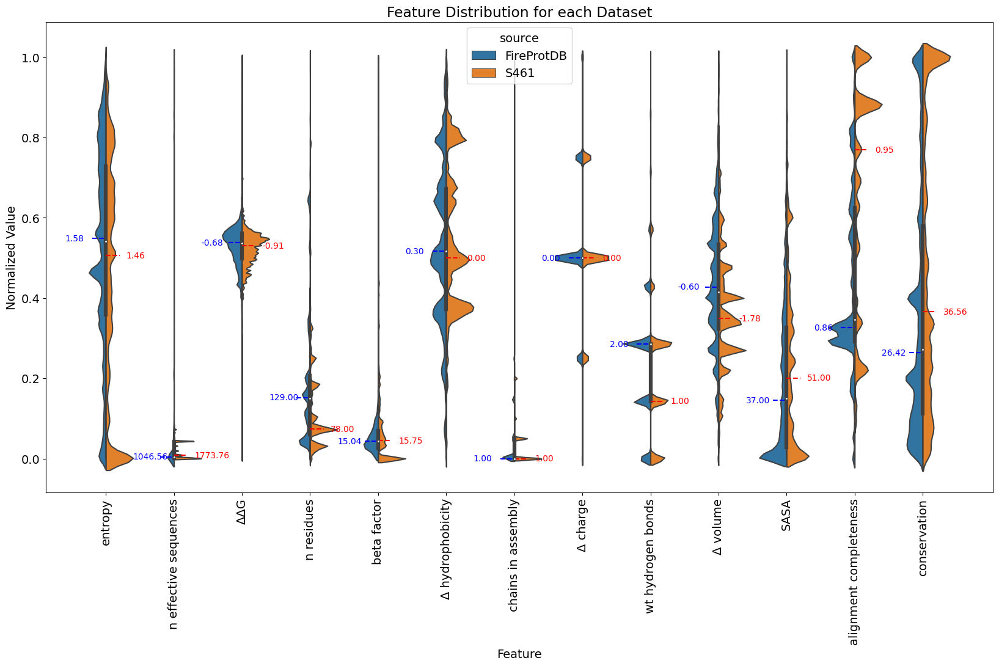

In [103]:
compare_distributions_violin(fp_feats.drop(['n_seqs', 'residue_depth', 'on_interface', 'column_completeness', 'saltbrs'], axis=1), s461_feats)

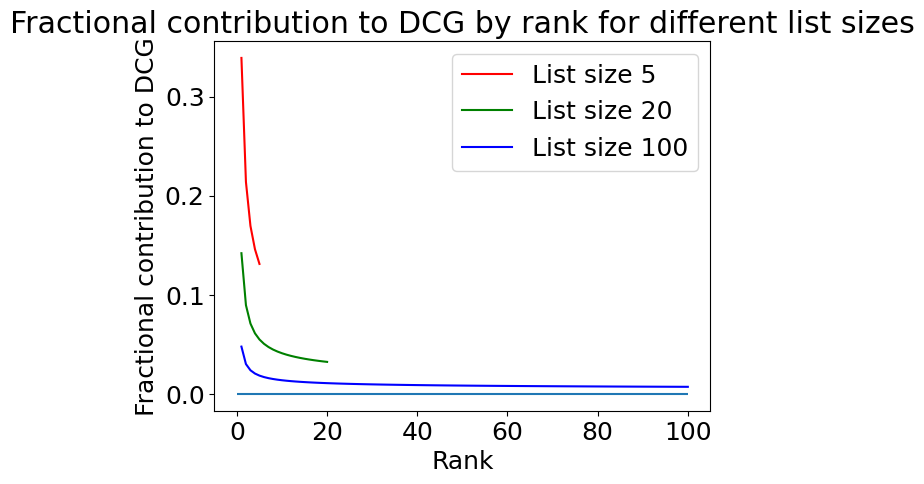

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()

In [ ]:
def extract_decimal_number(text):
    # Define a regular expression to match decimal numbers
    decimal_regex = r"\d+\.\d+"
    
    # Search for the decimal number in the text using the regular expression
    match = re.search(decimal_regex, text)
    
    # If a match is found, return the float value of the matched string
    if match:
        return float(match.group())
    
    # If no match is found, return NaN
    return np.nan

neff = pd.read_csv(os.path.join(path, '..', 'neff.csv'), header=None).set_index(0)
neff.index.name = 'code'
neff.columns = ['neff']
neff = neff.groupby(level=0).max()

s669_feats = pd.read_csv(os.path.join(path, '..', 's669_mapped_feats.csv'))
s669_feats['uid'] = s669_feats['code'] + '_' + s669_feats['position'].astype(str) + s669_feats['mutation']
s669_feats = s669_feats[['uid', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'residue_depth', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'nmr_xray', 'pH', 'resolution',
                        'DDG_checked_dir']]

s669_feats['on_interface'] = s669_feats['on_interface'].astype(int)
s669_feats['features'] = s669_feats['features'].fillna("")#.apply(list)
s669_feats = s669_feats.rename({'DDG_checked_dir': 'ddG'}, axis=1)

s669_feats = s669_feats.set_index('uid')
#s669_feats = s669_feats.join(s669_feats.set_index('uid')).drop('code', axis=1).drop('uid2', axis=1).reset_index().drop('uid2', axis=1).set_index('uid')

s669_feats['delta_kdh'] = s669_feats['kdh_mut'] - s669_feats['kdh_wt']
s669_feats['delta_vol'] = s669_feats['vol_mut'] - s669_feats['vol_wt']
s669_feats['delta_chg'] = s669_feats['chg_mut'] - s669_feats['chg_wt']
#s669_feats['delta_asa'] = s669_feats['SOL_ACC_inv'] - s669_feats['SOL_ACC_dir']
s669_feats['to_proline'] = (s669_feats.index.str[-1] == 'P').astype(int)
s669_feats['to_glycine'] = (s669_feats.index.str[-1] == 'G').astype(int)
s669_feats['from_proline'] = s669_feats['wild_type'] == 'P'
s669_feats['from_glycine'] = s669_feats['wild_type'] == 'G'
s669_feats['helix'] = s669_feats['SS'] == 'H'
s669_feats['bend'] = s669_feats['SS'] == 'S'
s669_feats['turn'] = s669_feats['SS'] == 'T'
s669_feats['coil'] = s669_feats['SS'] == '-'
s669_feats['strand'] = s669_feats['SS'] == 'E'
s669_feats['xray_else_NMR'] = s669_feats['nmr_xray'].str.contains('X-RAY')
s669_feats['active_site'] = s669_feats['features'].str.contains('ACT_SITE')
s669_feats['resolution'] = s669_feats['resolution'].fillna('').apply(lambda x: extract_decimal_number(x))
#s669_feats['mpnn_median_dir'] = s669_feats[['mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir']].mean(axis=1)
s669_feats = s669_feats.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type', 'nmr_xray'], axis=1)
# 'mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir', 'mpnn_10_dir', 'mpnn_30_dir', 'mpnn_30_03_dir', 'mpnn_20_02_dir',
s669_feats['code'] = s669_feats.index.str[:4]
s669_feats = s669_feats.merge(neff['neff'].dropna(), on='code', how='left').drop('code', axis=1)#.set_index('uid')

s669_feats['neff'] = s669_feats['neff'].fillna(0)

fp_feats = db_feats_2.copy(deep=True).join(db_measurements)
fp_feats['neff'] = fp_feats['neff'].fillna(0)

In [ ]:
def compare_stable_dists(db_complete, score_name, decision_threshold_ddg=0, decision_threshold_score=0, x_label_1=None):

    dbf = db_complete.copy(deep=True)
    dbf = dbf.loc[:, [score_name, 'ddG']]
    min_score = dbf[score_name].min() + 1
    min_ddg = dbf['ddG'].min() + 1

    # todo: add dTm
    df_out = pd.Series(index = ['n_expt_stable', 'P(pred_stable|stable) - sensitivity', 'P(pred_stable|unstable) - FPR',\
                                 'n_pred_stable', 'P(stable|pred_stable) - PPV', 'P(stable|pred_unstable) - FOR'], dtype=float)
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    #fig.suptitle(score_name)
    axs[0].set_title(f'Predicted stability by experimental class')
    axs[1].set_title(f'Experimental stability by predicted class')

    stable = dbf.loc[dbf['ddG'] > decision_threshold_ddg, :].dropna().copy()
    stable['expt_stable'] = True
    unstable = dbf.loc[dbf['ddG'] <= decision_threshold_ddg, :].dropna().copy()
    unstable['expt_stable'] = False
    to_plot = pd.concat([stable, unstable])

    df_out['n_expt_stable'] = len(stable)
    df_out['P(pred_stable|stable) - sensitivity'] = len(stable.loc[stable[score_name] >= decision_threshold_score]) / len(stable)
    df_out['P(pred_stable|unstable) - FPR'] = len(unstable.loc[unstable[score_name] >= decision_threshold_score]) / len(unstable)

    left = len(stable.loc[stable[score_name] <= decision_threshold_score])
    right = len(stable.loc[stable[score_name] > decision_threshold_score])
    sns.histplot(ax=axs[0], data=to_plot, x=score_name, hue='expt_stable')
    axs[0].annotate(f'FN:{left}, TP:{right}', xy=(min_score,40))
    axs[0].axvline(x = decision_threshold_score, color = 'r', label = 'axvline - full height')
    axs[0].set_xlabel(x_label_1)

    avg = stable[score_name].mean()
    print('Average prediction for stabilized protein:', avg)

    predicted_stable = dbf.loc[dbf[score_name] > decision_threshold_score, :].dropna().copy()
    predicted_stable['pred_stable'] = True
    predicted_unstable = dbf.loc[dbf[score_name] <= decision_threshold_score, :].dropna().copy()
    predicted_unstable['pred_stable'] = False
    to_plot = pd.concat([predicted_stable, predicted_unstable])

    df_out['n_pred_stable'] = len(predicted_stable)
    df_out['P(stable|pred_stable) - PPV'] = len(predicted_stable.loc[predicted_stable['ddG'] >= decision_threshold_ddg]) / len(predicted_stable)
    df_out['P(stable|pred_unstable) - FOR'] = len(predicted_unstable.loc[predicted_unstable['ddG'] >= decision_threshold_ddg]) / len(predicted_unstable)
    
    left = len(predicted_stable.loc[predicted_stable['ddG'] <= decision_threshold_ddg])
    right = len(predicted_stable.loc[predicted_stable['ddG'] > decision_threshold_ddg])
    sns.histplot(ax=axs[1], data=to_plot, x='ddG', hue='pred_stable')
    axs[1].annotate(f'FP:{left}, TP:{right}', xy=(min_ddg,40))
    axs[1].axvline(x = decision_threshold_ddg, color = 'r', label = 'axvline - full height')

    avg = predicted_stable['ddG'].mean()
    print('Average experimental value for predicted stabilized:', avg)
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.show()

    return df_out

s = dfm.drop(['ProTherm', 'FireProt', 'ThermoFluor'], axis=1).drop_duplicates().drop('code', axis=1).dropna(subset='korpm_dir') #.join(db_feats_2, how='left')
compare_stable_dists(s, 'cartesian_ddg_dir + mpnn_mean_dir * 0.5', decision_threshold_ddg=0, decision_threshold_score=0, x_label_1='Rosetta_CartDDG + ProteinMPNN_mean * 0.5')

In [ ]:
compare_stable_dists(s, 'cartesian_ddg_dir', decision_threshold_ddg=0, decision_threshold_score=0, x_label_1='Rosetta_CartDDG')

In [ ]:
# default plotting settings
font = {'size'   : 16}
matplotlib.rc('font', **font)

int_runtimes = db_runtimes.dropna(axis=1, how='all').groupby('code').mean()#.sum()
int_runtimes = int_runtimes[['runtime_esmif_monomer_dir',
                             'runtime_esmif_multimer_full_dir',
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_mpnn_mean_dir',
                             'runtime_tranception_red_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_msa_transformer_1_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm1v_2_dir',
                             'runtime_cartesian_ddg_dir',
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

hybrid = ['mifst', 'PremPS', 'ACDC-NN', 'DDGun3D', 'INPS3D', 'SAAFEC-Seq', 'SDM', 'DUET', 'Dynamut', 'MAESTRO', 'I-Mutant3.0']
evolutionary = ['INPS-Seq', 'tranception_red', 'msa_transformer_mean', 'msa_transformer_1', 'ACDC-NN-Seq', 'DDGun', 'I-Mutant3.0-Seq', 'esm1v', 'SAAFEC-Seq']
sequence = ['esm1v_mean', 'esm1v_2']
structural = ['cartesian_ddg', 'esmif_multimer', 'esmif_multimer_full', 'esmif_monomer', 'mpnn_20_00', 'mpnn_mean', 'mif', 'monomer_ddg', 'FoldX', 'ThermoNet', 'mCSM', 'MuPro', 'PopMusic' 'SOL_ACC']

cmap = {}
for h in hybrid:
    cmap.update({h: 'purple'})
for e in evolutionary:
    cmap.update({e: 'green'})
for s in structural:
    cmap.update({s: 'red'})
for s in sequence:
    cmap.update({s: 'blue'})

hybrid_patch = Patch(color='purple', label='Hybrid')
evolutionary_patch = Patch(color='green', label='Evolutionary')
structural_patch = Patch(color='red', label='Structural')
sequence_patch = Patch(color='blue', label='Sequence')

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10))  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', palette=cmap, alpha=0.2)
ax.legend(handles=[hybrid_patch, evolutionary_patch, structural_patch, sequence_patch], title='Input', loc='upper left')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
#plt.legend(handles, labels, ncol=1, loc='best')
#plt.xscale('log')
plt.yscale('log')
plt.xticks(rotation=90)
#plt.yticks(rotation=90)
plt.title('Mean Prediction Time per Protein in FireProtDB')
plt.xlabel('')
plt.ylabel('Log(runtime (s))')
plt.show()
total_runtimes